*Benjamin Bradley*

**Date: July 24th, 2024**

Summary:
- Cleaned up velocity initialization at varying starting radii to get actually stable orbits at varying radii (correcting error from last conversation)
- Experimented with different weight combinations while observing the standard game state (radius, radial velocity, tangential velocity)
- Adding in Hohmann estimates for desired $Δv_1$ and $Δv_2$ as a nudge of extra information.
- Further experiments with state space ($Δv_1$, $Δv_2$, $r*v_{tang}$, $\sqrt{r}$, $\frac{1}{\sqrt{r}}$

## Non-Hohmann conscious approaches

##### Imports, Animation, PPO, Environment

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
%cd "/content/drive/MyDrive/UTRA/240711 BB/Trained model arrays"

import torch
import numpy as np

import gym
import itertools
import statsmodels.api as sm

import plotly.io as pio
import plotly.express as px
import plotly.graph_objs as go


import os
import glob
import time
from datetime import datetime

import torch
import numpy as np

import matplotlib
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.animation import FuncAnimation
from matplotlib.patches import FancyArrowPatch as Arrow
from typing import Any, List, Sequence, Tuple

import math
import tensorflow as tf
from typing import Optional, Union

import gym
from gym import logger, spaces
from gym.envs.classic_control import utils
from gym.error import DependencyNotInstalled

import torch
import torch.nn as nn
from torch.distributions import MultivariateNormal
from torch.distributions import Categorical

from IPython.display import HTML
from base64 import b64encode
from typing import Any, List, Sequence, Tuple

Mounted at /content/drive
/content/drive/.shortcut-targets-by-id/1OUdtbpq4Cu2q3Dg3IOYcFQ3o8C9SSBww/240711 BB/Trained model arrays


In [ ]:
from logging import raiseExceptions
from typing import (
    Any,
    Generic,
    Iterable,
    List,
    Mapping,
    Optional,
    Sequence,
    Tuple,
    Type,
    TypeVar,
    Union,
    Dict,
    Callable
)

import numpy as np
import matplotlib.pyplot as plt

import gym
from gym.spaces import Box
from gym.utils import seeding

## I deleted from animation in order ton use the animation I have in the notebook
## Adding a continous episode option
def make(name):
    '''
    Initialize Rocket Circularization environment. Contains the environment hyperparameters

    `RocketCircularization-v0` has wall mechanics on. When the craft hits the boundary, it will
    loose all orthogonal velocity towards the boundary.
    `RocketCircularization-v1` has wall mechanics off. When the craft hits the boundary, it will
    pass through boundary and mark the state as truncated.

    Usage:
    ```python
    env = make('RocketCircularization-v0')
    ```
    or in notebooks
    ```python
    with make('RocketCircularization-v0') as env:
        ...
    ```
    '''
    if name == 'RocketCircularization-v0':
        init_func = varied_l(r_min=0.5, r_max=1.5)
        return RocketEnv(max_step=400, simulation_step=3, rmax=1.5, rmin=0.5,
                         init_func=init_func, max_thrust=.1,
                         oob_penalty=0, dt=0.03, wall_mechanics=True,
                         velocity_penalty_rate=0.1, thrust_penalty_rate=0.001)


    else:
        raise ValueError(f'No environment {name}')


def uniform(r_min: float = 0.99, r_max: float = 1.01,
            rdot_min: float = -0.05, rdot_max: float = 0.05,
            thetadot_min: float = 0.99, thetadot_max: float = 1.01) \
        -> Callable[[], List[np.float32]]:
    '''
    Produces a function that generates initial conditions at different angles uniformly under those
    conditions

    r_min: minimum bound for radius
    r_max: maximum bound for radius
    rdot_min: minimum bound for radial velocity
    rdot_max: maximum bound for radial velocity
    thetadot_min: minimum bound for angular velocity
    thetadot_max: maximum bound for angular velocity

    Return:
        A function that when called, returns an initial condition
    '''
    def func():
        nonlocal r_min, r_max, rdot_min, rdot_max, thetadot_min, thetadot_max

        r = np.random.uniform(r_min, r_max)
        theta = np.random.uniform(0, 2 * np.pi)
        rdot = np.random.uniform(rdot_min, rdot_max)
        thetadot = np.random.uniform(thetadot_min, thetadot_max)

        pos = [r, 0]
        vel = [rdot, r * thetadot]

        rot_mat = np.array([[np.cos(theta), -np.sin(theta)],
                            [np.sin(theta), np.cos(theta)]])

        return [*(rot_mat @ pos), *(rot_mat @ vel)]
    return func


def varied_l(r_min: float = 0.9, r_max: float = 1.1,
             rdot_min: float = -0.5, rdot_max: float = 0.5,
             dl_min: float = -.5, dl_max: float = .5) \
        -> Callable[[], List[np.float32]]:
    '''
    Produces a function that generates initial conditions at different angles uniformly with
    a range of angular momentum settings

    r_min: minimum bound for radius
    r_max: maximum bound for radius
    rdot_min: minimum bound for radial velocity
    rdot_max: maximum bound for radial velocity
    dl_min: minimum deviation of angular momentum from target angular momentum
    dl_max: maximum deviation of angular momentum from target angular momentum

    Return:
        A function that when called, returns an initial condition
    '''
    def func():
        nonlocal r_min, r_max, rdot_min, rdot_max

        r = np.random.uniform(r_min, r_max)
        theta = np.random.uniform(0, 2 * np.pi)
        rdot = np.random.uniform(rdot_min, rdot_max)
        thetadot = (1 + np.random.uniform(dl_min, dl_max)) / r ** 2

        pos = [r, 0]
        vel = [rdot, r * thetadot]

        rot_mat = np.array([[np.cos(theta), -np.sin(theta)],
                            [np.sin(theta), np.cos(theta)]])
        #print("reset positon", pos)
        return [*(rot_mat @ pos), *(rot_mat @ vel)]
    return func


def target_l(r_min: float = 0.5, r_max: float = 1.5,
             rdot_min: float = -0.5, rdot_max: float = 0.5) \
        -> Callable[[], List[np.float32]]:
    '''
    Produces a function that generates initial conditions at different angles uniformly
    with the target angular momentum

    r_min: minimum bound for radius
    r_max: maximum bound for radius
    rdot_min: minimum bound for radial velocity
    rdot_max: maximum bound for radial velocity

    Return:
        A function that when called, returns an initial condition
    '''
    def func():
        nonlocal r_min, r_max, rdot_min, rdot_max

        r = np.random.uniform(r_min, r_max)
        theta = np.random.uniform(0, 2 * np.pi)
        rdot = np.random.uniform(rdot_min, rdot_max)
        thetadot = 1 / r ** 2

        pos = [r, 0]
        vel = [rdot, r * thetadot]

        rot_mat = np.array([[np.cos(theta), -np.sin(theta)],
                            [np.sin(theta), np.cos(theta)]])

        return [*(rot_mat @ pos), *(rot_mat @ vel)]
    return func

def testing_1() -> Callable[[], List[np.float32]]:
  def func():
    r = 1
    theta = np.random.uniform(0, 2 * np.pi)
    rdot = 0
    thetadot = 1

    pos = [r, 0]
    vel = [rdot, r * thetadot]

    rot_mat = np.array([[np.cos(theta), -np.sin(theta)],
                            [np.sin(theta), np.cos(theta)]])

    return [*(rot_mat @ pos), *(rot_mat @ vel)]
  return func

def orbit1_1() -> Callable[[], List[np.float32]]:
  def func():
    r = 1.1
    theta = np.random.uniform(0, 2 * np.pi)
    rdot = 0
    thetadot = 0.9535

    pos = [r, 0]
    vel = [rdot, r * thetadot]

    rot_mat = np.array([[np.cos(theta), -np.sin(theta)],
                              [np.sin(theta), np.cos(theta)]])

    return [*(rot_mat @ pos), *(rot_mat @ vel)]
  return func


# FIRST MODIFICATION : CHANGE OF THE QUADRATIC PENALTY

def quadratic_penalty(state: np.ndarray, action: np.ndarray, r_target: float =1,
                      w_r: float=1, w_p :float =1,w_t :float =0.5,
                      G: float = 1, M: float = 1,mode: str = 'abs') -> np.float32:
    '''
    Calculates the Quadratic reward at the current state with the current action. Subject to change.

    Current definition
    reward = w_r(r - rtarget)^2  + w_p(rtarget*vtangential_target - vtangential*r)^2 - w_T * |u|^2

    Arguments
    state: the current game state (x,y,vx,vy);
    action: actions performed to reach this state (F_tx, F_ty)
    rtarget: target radius of the craft (1)
    w-rm, w_p, w_t : the weights respective of each difference in the quadratic function

    G: Gravitational Constant, default 1
    M: Mass of center object, default 1

    Return:
      A scalar that has as a goal to converge to 0 with training
    '''
    vtarget = np.sqrt(G * M / r_target)
    r, v = state[:2], state[2:]
    dist = np.linalg.norm(r)
    rhat = r / dist
    rotation_matrix = np.array([[rhat[0], rhat[1]], [-rhat[1], rhat[0]]])
    vpolar = rotation_matrix @ v
    #print("Action in quadratic ",action)
    #print("dist:", dist - r_target, " angular momentum:", vpolar[1]*dist -vtarget*r_target, "action",np.linalg.norm(action))
    if mode == 'squared' :
      quadratic = w_r*(dist - r_target)**2 + w_p*(vpolar[1]*dist -vtarget*r_target)**2 + w_t*(np.linalg.norm(action))**2
    elif mode == 'abs' :
      quadratic = w_r*abs(dist - r_target) + w_p*abs(vpolar[1]*dist -vtarget*r_target) + w_t*abs(np.linalg.norm(action))

    #w_t*np.linalg.norm(action)**2
    #print(quadratic)
    return quadratic


# SAME HERE (type of reward function ?)
def clip_by_norm(t: np.ndarray, mins: float, maxs: float) -> np.ndarray:
    '''
    Clip the vector by its l2 norm between an interval.

    t: the vector to clip
    mins: the minimum norm
    maxs: the maximum norm

    Return:
        Clipped vector

    Raises:
        ValueError: when norm of input vector is zero and minimum is not zero
    '''
    norm = np.linalg.norm(t)
    if np.count_nonzero(t) == 0 and mins > 0:
        raise ValueError('Trying to clip norm of zero vector')
    if norm < mins:
        t = t * mins / norm
    elif norm > maxs:
        t = t * maxs / norm

    return t

# MODIFICATION : The quadratic function is wrapped by a -log, in order to maximize the reward
# when converging to 0 with an option to clip the reward function especially when the vlaue of the quadratic
# converges to 0

def reward_function(state: np.ndarray, action: np.ndarray, rtarget: float,
                    w_r: float=1, w_p :float =1,w_t :float =1,
                    mode: str = 'Log_10', min :float = 0, max :float = 4, G: float = 1, M: float = 1) -> np.float32:
    '''
    Calculates the reward at the current state with the current action. Subject to change.

    state: the current game state
    action: actions performed to reach this state
    rtarget: target radius of the craft
    velocity_penalty_rate: ratio of velocity penalty to radius penalty
    thrust_penalty_rate: ratio of thrust penalty to radius penalty
    mode: Mode of rewards, one of 'Quadratic' or 'Gaussian'
            Quadratic: -(r - rtarget)^2 - velocity_penalty * (v_r^2 + (v_t - v_t,target)^2) - thrust_penalty * |u|^2
            Gaussian: exp(-(r - rtarget)^2 - velocity_penalty * (v_r^2 + (v_t - v_t,target)^2) - thrust_penalty * |u|^2)

    G: Gravitational Constant, default 1
    M: Mass of center object, default 1

    Return:
        Reward in this state
    '''
    value = quadratic_penalty(state, action, rtarget,w_r,w_p,w_t, G, M)

    if mode == 'Quadratic':
        return value
    elif mode == 'Log_10':
        #print(np.clip(-np.log10(value),min,max))
        return np.clip(-np.log10(value),min,max)
    elif mode == 'Ln' :
        return np.clip(-np.log(value),min,max)
    elif mode ==  'Inverse' :
        return np.clip(1/(value), min, max)
    else:
        ValueError(f'Invalid reward mode {mode}')

## THAT IS SOMETHING ELSE TO THINK ABOUT IF COMING BACK TO CONTINOUS EPISODES
## MY THOUGHT IS THAT INSTEAD OF REACHING A BOUND, HAVE A 0 REWARD AND START BACK LIKE REINTIALIZE
## SO CAN STILL BE SEEN AS EPISODES

class RocketEnv(gym.Env):
    '''
    Open AI Gym environment for Rocket Circularization
    '''

    # Getting rid of the wall mechanics
    # rmin and rmax will be used as bounds

    def __init__(self,
                 G: float = 1, M: float = 1, m: float = .01, dt: float = .01,
                 rmin: float = .1, rmax: float = 2, rtarget: float = 1, vmax: float = 10,
                 w_r:float = 1, w_p:float =1, w_t: float=1, mode: str = 'Log_10',
                 init_func: Callable[[], np.ndarray] = varied_l(),
                 oob_penalty: float = 10, max_thrust: float = .1, clip_thrust: str = 'Ball',
                 max_step: int = 500, simulation_step: int = 1) -> None:
        '''
        Initializes the environment

        G: Gravitational Constant, default 1
        M: Mass of center object, default 1
        m: Mass of orbiting object, default .01
        dt: Simulation time step, default .01

        rmin: game space radius lower bound, default .1
        rmax: game space radius upper bound, default 2
        rtarget: the target radius the craft is supposed to reach, default 1
        vmax: maximum velocity allowed in the game space (implemented for simulation accuracy and network interpolation), default 10
        w_r,w_p,w_t =  the weights respective of each difference in the quadratic function
        oob_penalty: penalty for being out of bounds, default 10
        init_func: function that returns an initial condition, default varied_l()
        velocity_penalty_rate: the penalty of velocity as a ratio of radius penalty
        thrust_penalty_rate: the penalty of thrust as a ratio of radius penalty

        max_step: number of iterations in each episode if no early-termination is encountered, default: 500
        simulation_step: number of simulation steps for every game step. Reducing timestep and increasing simulation step
                increases simulation accuracy, but may be more computationally straining
        '''
        super().__init__()

        #print("It is my environment that is running")
        self.observation_space = Box(low=np.array([-rmax, -rmax, -vmax, -vmax]),
                                     high=np.array([rmax, rmax, vmax, vmax]),
                                     shape=(4, ), dtype=np.float32)
        self.action_space = Box(low=np.array([-max_thrust, -max_thrust]),
                                high=np.array([max_thrust, max_thrust]),
                                shape=(2, ), dtype=np.float32)

        self.G, self.M, self.m, self.dt = G, M, m, dt
        self.rmin, self.rmax, self.rtarget = rmin, rmax, rtarget
        self.vmax = vmax
        self.oob_penalty = oob_penalty
        self.max_thrust = max_thrust
        self.min_action = -self.max_thrust
        self.max_action = self.max_thrust
        self.clip_thrust = clip_thrust
        self.init_func = init_func
        self.w_r = w_r
        self.w_p = w_p
        self.w_t = w_t
        self.mode = mode
        self.max_step, self.simulation_step = max_step, simulation_step
        self.iters = 0

        #things to visualise what's happening
        self.reward = 0
        self.number_action = 0


        # Animation object
        lim = rmax * 1.1
        self.animation = RocketAnimation(r_min=rmin, r_target=rtarget, r_max=rmax, xlim=(-lim, lim), ylim=(-lim, lim),
                                         markersize=10, circle_alpha=1, t_vec_len=.1)

    def reset(self, seed: Optional[int] = None,
              return_info: bool = False,
              options: Optional[dict] = None) -> Union[np.ndarray, Tuple[np.ndarray, dict]]:
        '''
        Resets the environment with a new state, return the new state as well as information
        if required.

        seed: NOT IMPLEMENTED, randomizer seed
        return_info: If information is returned
        options: some options for initialization
                init_func: the function used to initialize the state, provided uniform, target_l, varied_l

        Return:
            the initial state, shape (4,)
        '''
        super().reset(seed=seed)

        if options is not None and 'init_func' in options:
            init_func = options['init_f   unc']
        else:
            init_func = self.init_func

        self.state = np.array(init_func())
        self.init_state = self.state
        self.iters = 0
        self.prev_score = - \
            np.abs(self.rmax - self.rtarget) - \
            self.w_p * 2 * self.vmax
        self.done = False
        self.last_action = np.array([0, 0])

        lim = self.rmax * 1.1
        self.animation = RocketAnimation(r_min=self.rmin, r_target=self.rtarget, r_max=self.rmax,
                                         xlim=(-lim, lim), ylim=(-lim, lim),
                                         markersize=10, circle_alpha=1, t_vec_len=.1)
        #print("reset state", self.state)
        # an empty dict ?
        if return_info:
            return self.state, dict()
        else:
            return self.state



    # CHANGES IN STEP IN ORDERN TO MAKE IT DISCOUNTINOUS :

    def step(self, action: np.ndarray) -> Union[Tuple[np.ndarray, float, bool, bool, dict],
                                                Tuple[np.ndarray, float, bool, dict]]:
        '''
        Accept action and modify the states accordingly.

        action: an array with shape (2,) representing the thrust component in the 2 cartesian directions.

        Return:
            state, shape (2,),
            reward from this state,
            if the game is done running,
            if the agent is out-of-bounds, and
            some more info about the game
        '''
        # If self.done : the episode should terminate as well !
        if self.done:
            print('Warning: Stepping after done is True')

        # GETTING ACTION INFORMATIONS
        # Clipp action if neede

        action = np.array(action)
        self.last_action = action
        #print("here the action is :", np.linalg.norm(action))
        if self.clip_thrust == 'Box':
            action = np.clip(action, -1, 1)
        elif self.clip_thrust == 'Ball':
            magnitude = np.linalg.norm(action)
            if magnitude > 1:
                action = action / magnitude
        elif self.clip_thrust == 'None':
            pass
        else:
            raise ValueError(
                f'Thrust clipping mode {self.clip_thrust} does not exist')
        # For easy access fro
        r, v = self.state[:2], self.state[2:]
        reward = 0
        info = dict()

        # SIMULATING STEPS
        # Simulate for a number of steps
        for _ in range(self.simulation_step):
          #while not self.done :
            # Calculate total force
            gravitational_force = - (self.G * self.M * self.m) / \
                (np.power(np.linalg.norm(r), 3)) * r  # F = - GMm/|r|^3 * r
            # NOTE : self.max_thrust gives the orer of grandeur !
            # action is what has the information that it's tangential
            thrust_force = action * self.m * self.max_thrust
            #print("thrust is", thrust_force)
            total_force = gravitational_force + thrust_force
            # Update position and location, this can somehow guarantee energy conservation
            # If the craft hits a wall, all normal velocity cancels
            # It's just using F = ma with a = F/m
            v = v + total_force / self.m * self.dt
            # v = clip_by_norm(v, 0, self.vmax)
            # same thing with v = dr/dt
            r = r + v * self.dt


          # No walls mechanics anymore
            #if self.wall_mechanics:
                #v = wall_clip_velocity(v, r, self.rmin, self.rmax)
                #r = clip_by_norm(r, self.rmin, self.rmax)
            # Scored-based reward structure

            # SELF.DONE INFORMAITON

            self.done = bool(
                  np.linalg.norm(r) < self.rmin
                  or np.linalg.norm(r) > self.rmax
              )
            if self.done :
                #print("it's done")
                #print("rmin :",self.rmin," rmax :",self.rmax, " r :",np.linalg.norm(r), )
              # It's an accumulatif reward at each iteration with the same action
              break
            #print(reward_function(np.array([*r,*v]),action,self.rtarget,w_r = self.w_r,
                                      #w_p= self.w_p, w_t = self.w_t, mode = self.mode))
            reward += reward_function(np.array([*r,*v]),action,self.rtarget,w_r = self.w_r,
                                      w_p= self.w_p, w_t = self.w_t, mode = self.mode)

        self.reward = reward
        self.state = np.array([*r, *v])
        self.iters += 1

        if self.iters >= self.max_step:
            self.done = True

        return self.state, self.reward, self.done, info

    def render(self, *args: Tuple[Any], **kwargs: Dict[str, Any]) -> None:
        '''
        Record frames of the animation. Need to be used in conjunction with the
        show() method.
        '''

        #print("I get here")
        #print("in render reward", self.reward )
        #print("env.render called")
        #print("all that is going into self.animation.render", self.state, self.last_action, self.last_action,
                              #self.rmin, self.rtarget, self.rmax, self.reward)

        #print("just last action", self.last_action)
        #print("WTFFF")
        self.animation.render(self.state, self.last_action, self.last_action,
                              self.rmin, self.rtarget, self.rmax)

    def show(self, path: Optional[str] = None, summary: bool = False) -> None:
        '''
        Show the saved frames of the animation or produce a summary

        path: if the animation is saved, the path to which it is saved. If None, the
                animation is shown in a pop-up window. Note that pop-up window
                animation does not work in notebooks, and need to be closed for
                the execution to continue. default, None
        summary: if animation is not saved, if to produce a summary plot of the game
                episode instead.
        '''
        if path is None:
            path = "path.mp4"
        self.animation.save_animation(path)
        self.animation.summary_plot()
        return path


##  MY WRAPPER ##
class CTangentialThrust(gym.ActionWrapper):
    '''
    Wrapper for RocketEnv. Provides continous ranges for thrust vectors in the tangential direction
    with unit length. Note that it needs to be used in conjuction with PolarizeAction for
    the thrust values to point in the tangential direction.
    '''

    def __init__(self, env: gym.Env):
        '''
        Initialize the wrapper.

        env: The environment to wrap, preferably with polar thrust
        '''
        super().__init__(env)
        self.action_space = gym.spaces.Box(low=-self.max_thrust, high= self.max_thrust, shape = (1,), dtype= np.float32)

    def action(self, action):
        '''
        Map integers to their correspnding thrust value.
        0: clockwise thrust
        1: no thrust
        2: counter-clockwise thrust

        action: integer value thrust choice

        Return:
            1d numpy array of shape (2,), representing the thrust value for this iteration.
        '''
        #print("It gets there ")
        #print(action)
        action = action[0].item()
        #print("here the action is", action)
        self.number_action = action
        action = np.array([0,action])
        #print(" the polar action should be :", action)
        state = self.unwrapped.state
        #print(" In order to verify manually : the current state is", state)
        r, v = state[:2], state[2:]
        dist = np.linalg.norm(r)
        rhat = r / dist
        rotation_matrix = np.array([[rhat[0], -rhat[1]], [rhat[1], rhat[0]]])
        action = rotation_matrix @ action
        #print(" The cartesian coordinate action is ", action)
        return action


class PolarizeObservation(gym.ObservationWrapper):
    '''
    Wrapper for RocketEnv. Wraps state to provide radius, radial velocity, and tangential
    velocity.
    '''

    def __init__(self, env: gym.Env) -> None:
        '''
        Initialize the wrapper.

        env: The environment to wrap
        '''
        super().__init__(env)

    def observation(self, obs: np.ndarray) -> np.ndarray:
        '''
        Given the observation in cartesian coordinates, convert to polar observation.
        obs: numpy array with shape (4,). State vector with first 2 as cartesian position
                and last 2 as cartesian velocity
        Return
            numpy array with shape (3,) with radius, radial velocity, and tangential velocity,
            in that order.
        '''
        r, v = obs[:2], obs[2:]
        dist = np.linalg.norm(r)
        rhat = r / dist
        rotation_matrix = np.array([[rhat[0], rhat[1]], [-rhat[1], rhat[0]]])
        obs = np.array([dist, *(rotation_matrix @ v)])
        return obs

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
def moving_average(data, window_size):
    """Calculate the moving average of the given list."""
    i = 0
    moving_averages = []

    while i < len(data) - window_size + 1:
        window_average = round(np.sum(data[
          i:i+window_size]) / window_size, 2)
        moving_averages.append(window_average)
        i += 1

    return moving_averages

def show_video(video_path, video_width = 600):
  video_file = open(video_path, "r+b").read()
  video_url = f"data:video/mp4;base64,{b64encode(video_file).decode()}"
  return HTML(f"""<video width={video_width} controls><source src="{video_url}"></video>""")

In [ ]:
print("============================================================================================")
device = torch.device('cpu')
if(torch.cuda.is_available()):
    device = torch.device('cuda:0')
    torch.cuda.empty_cache()
    print("Device set to : " + str(torch.cuda.get_device_name(device)))
else:
    print("Device set to : cpu")


################################## PPO Policy ##################################
class RolloutBuffer:
    def __init__(self):
        self.actions = []
        self.states = []
        self.logprobs = []
        self.rewards = []
        self.state_values = []
        self.is_terminals = []

    def clear(self):
        del self.actions[:]
        del self.states[:]
        del self.logprobs[:]
        del self.rewards[:]
        del self.state_values[:]
        del self.is_terminals[:]

# It's very similar to the initial actor critic class implemented above

class ActorCritic(nn.Module):
    def __init__(self, state_dim, action_dim, has_continuous_action_space, action_std_init):
        super(ActorCritic, self).__init__()
        #In this section I'm only interested in the continous space
        self.has_continuous_action_space = has_continuous_action_space

        if has_continuous_action_space:
            self.action_dim = action_dim
            self.action_var = torch.full((action_dim,), action_std_init * action_std_init).to(device)

        # actor
        #I'm mainly going to keep the same dimensions as the ones used above
        if has_continuous_action_space :
            self.actor = nn.Sequential(
                            nn.Linear(state_dim, 12),
                            nn.LeakyReLU(),
                            nn.Linear(12, 12),
                            nn.LeakyReLU(),
                            nn.Linear(12, 12),
                            nn.LeakyReLU(),
                            nn.Linear(12, 12),
                            nn.LeakyReLU(),
                            nn.Linear(12, action_dim),
                            nn.Tanh()
                        )
            #the use of tanh here maps the actions in the range -1 / 1.
        else:
            self.actor = nn.Sequential(
                            nn.Linear(state_dim, 12),
                            nn.LeakyReLU(),
                            nn.Linear(12, 12),
                            nn.LeakyReLU(),
                            nn.Linear(12, 12),
                            nn.LeakyReLU(),
                            nn.Linear(12, 12),
                            nn.Tanh(),
                            nn.Linear(12, action_dim),
                            nn.Softmax(dim=-1)
                        )
            # the use of softmax if it's not continous gives for each action, a probability associated.
        # critic
        self.critic = nn.Sequential(
                        nn.Linear(state_dim, 12),
                        nn.Tanh(),
                        nn.Linear(12, 12),
                        nn.Tanh(),
                        nn.Linear(12, 12),
                        nn.Tanh(),
                        nn.Linear(12, 12),
                        nn.Tanh(),
                        nn.Linear(12, 1)
                    )
        # The use of tanh as an activation function here prevents a gradient
        #explosion by keeping in between the layers the values between -1/1


    def set_action_std(self, new_action_std):
        if self.has_continuous_action_space:
            self.action_var = torch.full((self.action_dim,), new_action_std * new_action_std).to(device)
        else:
            print("--------------------------------------------------------------------------------------------")
            print("WARNING : Calling ActorCritic::set_action_std() on discrete action space policy")
            print("--------------------------------------------------------------------------------------------")


    # This function is used during the interaction phase, where the agent interacts with the environment to collect experiences.
    def act(self, state, min, max):
        # the continous action
        if self.has_continuous_action_space:
          #so the actor has as a purpose to give off the meand of the action explaining even more the use of tanh
            action_mean = self.actor(state)
            # so that's where we aff the varience to it
            cov_mat = torch.diag(self.action_var).unsqueeze(dim=0)
            # This creqtes the multivavariate normal distribution with the specified mean and cov_mat
            dist = MultivariateNormal(action_mean, cov_mat)
        else:
            action_probs = self.actor(state)
            dist = Categorical(action_probs)
        # It samples from the distribution the action
        action = dist.sample()
        #print("action before clamp",action)
        #action = torch.clip(action,min,max) #ensures that the action is between a specific range.
        #print("action after clamp", action)
        action_logprob = dist.log_prob(action)
        state_val = self.critic(state)

        return action.detach(), action_logprob.detach(), state_val.detach()

  # This function is used during the training phase
    def evaluate(self, state, action):

        if self.has_continuous_action_space:

            action_mean = self.actor(state)
            action_var = self.action_var.expand_as(action_mean)
            cov_mat = torch.diag_embed(action_var).to(device)
            dist = MultivariateNormal(action_mean, cov_mat)

            # For Single Action Environments.(which is our situation here)
            if self.action_dim == 1:
                action = action.reshape(-1, self.action_dim)
        else:
            action_probs = self.actor(state)
            dist = Categorical(action_probs)
        action_logprobs = dist.log_prob(action)
        dist_entropy = dist.entropy()
        state_values = self.critic(state)

        return action_logprobs, state_values, dist_entropy


class PPO:
    def __init__(self, state_dim, action_dim, lr_actor, lr_critic, gamma, K_epochs, eps_clip, has_continuous_action_space=True, action_std_init=0.6):

        self.has_continuous_action_space = has_continuous_action_space

        if has_continuous_action_space:
            self.action_std = action_std_init

        self.gamma = gamma # discount factor
        self.eps_clip = eps_clip
        self.K_epochs = K_epochs
        self.buffer = RolloutBuffer()
        self.policy = ActorCritic(state_dim, action_dim, has_continuous_action_space, action_std_init).to(device)
        self.optimizer = torch.optim.Adam([
                        {'params': self.policy.actor.parameters(), 'lr': lr_actor},
                        {'params': self.policy.critic.parameters(), 'lr': lr_critic}
                    ]) #specific learning rate for the actor and for the critic

        self.policy_old = ActorCritic(state_dim, action_dim, has_continuous_action_space, action_std_init).to(device) #I'm wondering if this line is actually necessary
        self.policy_old.load_state_dict(self.policy.state_dict()) # apparently that copies the weights of the policy dict so that it starts at the same point, before any update is being made.

        self.MseLoss = nn.MSELoss()

    def set_action_std(self, new_action_std):
        if self.has_continuous_action_space:
            self.action_std = new_action_std
            self.policy.set_action_std(new_action_std)
            self.policy_old.set_action_std(new_action_std)
        else:
            print("--------------------------------------------------------------------------------------------")
            print("WARNING : Calling PPO::set_action_std() on discrete action space policy")
            print("--------------------------------------------------------------------------------------------")

#we decay the standard deviation in order to have a more norrow down possible actions to take so more exploitation and less exploration.
    def decay_action_std(self, action_std_decay_rate, min_action_std):
        print("--------------------------------------------------------------------------------------------")
        if self.has_continuous_action_space:
            self.action_std = self.action_std - action_std_decay_rate
            self.action_std = round(self.action_std, 4)
            if (self.action_std <= min_action_std):
                self.action_std = min_action_std
                print("setting actor output action_std to min_action_std : ", self.action_std)
            else:
                print("setting actor output action_std to : ", self.action_std)
            self.set_action_std(self.action_std)

        else:
            print("WARNING : Calling PPO::decay_action_std() on discrete action space policy")
        print("--------------------------------------------------------------------------------------------")

    def select_action(self, state, min , max):
        #print("It's getting there")
        if self.has_continuous_action_space:
            with torch.no_grad():
                #print("before state")
                state = torch.FloatTensor(state).to(device)
                #print("before policy_old.act")
                action, action_logprob, state_val = self.policy_old.act(state, min, max)
                #print("action in select_action", action)# so it's the old policy that acts. Because it's the previous policy that has been updated from the previous update but hasn't acted yet
            #print("action ",action, " action_logprob ", action_logprob, " state_val ",state_val)
            #print("the buffer will get updated")
            self.buffer.states.append(state)
            self.buffer.actions.append(action)
            self.buffer.logprobs.append(action_logprob)
            self.buffer.state_values.append(state_val)
            #print("the buffer got updated")

            return action.detach().cpu().numpy().flatten()
        else:
            with torch.no_grad():
                state = torch.FloatTensor(state).to(device)
                action, action_logprob, state_val = self.policy_old.act(state)

            self.buffer.states.append(state)
            self.buffer.actions.append(action)
            self.buffer.logprobs.append(action_logprob)
            self.buffer.state_values.append(state_val)

            return action.item()

    def update(self):
        # Monte Carlo estimate of returns
        rewards = []
        discounted_reward = 0  # wait why is it 0 though ?
        for reward, is_terminal in zip(reversed(self.buffer.rewards), reversed(self.buffer.is_terminals)): #This is basically doing with a for loop what my discount function was doing
            if is_terminal: # finish
                discounted_reward = 0
            discounted_reward = reward + (self.gamma * discounted_reward)
            rewards.insert(0, discounted_reward)

        # Normalizing the rewards
        rewards = torch.tensor(rewards, dtype=torch.float32).to(device)
        rewards = (rewards - rewards.mean()) / (rewards.std() + 1e-7)

        # convert list to tensor
        old_states = torch.squeeze(torch.stack(self.buffer.states, dim=0)).detach().to(device)
        old_actions = torch.squeeze(torch.stack(self.buffer.actions, dim=0)).detach().to(device)
        old_logprobs = torch.squeeze(torch.stack(self.buffer.logprobs, dim=0)).detach().to(device)
        old_state_values = torch.squeeze(torch.stack(self.buffer.state_values, dim=0)).detach().to(device)

        # calculate advantages
        advantages = rewards.detach() - old_state_values.detach()

        # Optimize policy for K epochs
        for _ in range(self.K_epochs):

            # Evaluating old actions and values
            logprobs, state_values, dist_entropy = self.policy.evaluate(old_states, old_actions)
            state_values = torch.squeeze(state_values)                                   # match state_values tensor dimensions with rewards tensor
            ratios = torch.exp(logprobs - old_logprobs.detach())                                     # Finding the ratio (pi_theta / pi_theta__old)
            surr1 = ratios * advantages                                                                                    # Finding Surrogate Loss
            surr2 = torch.clamp(ratios, 1-self.eps_clip, 1+self.eps_clip) * advantages
            loss = -torch.min(surr1, surr2) + 0.5 * self.MseLoss(state_values, rewards) - 0.01 * dist_entropy # final loss of clipped objective PPO
            self.optimizer.zero_grad()                                                                                         # take gradient step
            loss.mean().backward()
            self.optimizer.step()

        # Copy new weights into old policy
        self.policy_old.load_state_dict(self.policy.state_dict())
        # clear buffer
        self.buffer.clear()

    def save(self, checkpoint_path):
        torch.save(self.policy_old.state_dict(), checkpoint_path)

    def load(self, checkpoint_path):
        self.policy_old.load_state_dict(torch.load(checkpoint_path, map_location=lambda storage, loc: storage))
        self.policy.load_state_dict(torch.load(checkpoint_path, map_location=lambda storage, loc: storage))

Device set to : cpu


In [ ]:
class RocketAnimation(object):
    def __init__(self, r_min=0.1, r_target=1, r_max=10, xlim=(-10.2, 10.2), ylim=(-10.2, 10.2), markersize=10, circle_alpha=1, t_vec_len=1):
        self.r_min = r_min
        self.r_target = r_target
        self.r_max = r_max

        self.marker_size = markersize
        self.circle_alpha = circle_alpha
        self.t_vec_len = t_vec_len

        self.states = list()
        self.thrusts = list()
        # Note : I am not using requested_thrust for now, but I let it because I think it could be interesting
        self.requested_thrusts = list()
        self.theta_dot = list()

        #plots to verify the behavior of the actor critic
        self.rewards = list()
        self.action = list()

        # Wait why on earth is that a list ??
        self.rmin = list()
        self.rtarget = list()
        self.rmax = list()

        self.xlim = xlim
        self.ylim = ylim


    #No changes are made to this function
    def _circle(self, radius):
        theta = np.linspace(0, 2 * np.pi, 100)
        x, y = radius * np.cos(theta), radius * np.sin(theta)
        return x, y

    def _init(self,):
        self.ax.clear()

        self.arrow = Arrow(posA=(0, 0), posB=(0, 0), arrowstyle='simple', mutation_scale=5, color='r')
        self.ax.add_patch(self.arrow)
        self.line, = self.ax.plot([], [], marker='o', markersize=self.marker_size, alpha=self.circle_alpha)
        self.min_circle, = self.ax.plot(*self._circle(self.r_min), '--', label='Minimum Radius')
        self.target_circle, = self.ax.plot(*self._circle(self.r_target), '--', label='Target Orbit')
        self.max_circle, = self.ax.plot(*self._circle(self.r_max), '--', label='Maximum Radius')
        self.ax.grid(True)
        self.ax.legend(loc='upper left')
        return self.line, self.min_circle, self.target_circle, self.max_circle


    def _animate(self, i):
        st = self.states[i]
        vec = self.thrusts[i] * self.t_vec_len * (self.xlim[1] - self.xlim[0])

        self.line.set_data([st[0]], [st[1]])
        self.min_circle.set_data(*self._circle(self.rmin[i]))
        self.target_circle.set_data(*self._circle(self.rtarget[i]))
        self.max_circle.set_data(*self._circle(self.rmax[i]))

        self.arrow.set_positions(posA=st[:2], posB=st[:2] + vec)
        self.fig.suptitle(f'Iteration: {i}')
        return self.line, self.min_circle, self.target_circle, self.max_circle

    def save_animation(self, name):
        self._transform_vectors()
        self.fig = plt.figure(figsize=(10, 10), num=1,
                              clear=True, tight_layout=True)
        self.ax = self.fig.add_subplot(111)
        anim = FuncAnimation(self.fig, self._animate, init_func=self._init, frames=len(
            self.states), blit=True, interval=100, repeat=False)
        anim.save(name, dpi=80)

    def _plot_thrust_magnitude(self, ax):
        ax.set_title('Thrust Magnitude')
        ax.plot(self.thrusts_norm, label='thrust magnitude')
        ax.plot(self.requested_thrusts_norm,
                    label='requested thrust magnitude')
        ax.grid(True)
        ax.legend()

    def _plot_thrust_value(self, ax):
        ax.set_title('Thrust Values')
        ax.plot([thrust[1]
                     for thrust in self.thrusts_polar], label='thrust tangent')
        ax.grid(True)
        ax.legend()

    def _plot_thrust_direction(self, ax):
        ax.set_title('Thrust Direction (Angle from $\hat{r}$)')
        ax.plot(self.thrust_direction, label='Thrust Direction')
        ax.plot(self.requested_thrust_direction,
                label='Requested Thrust Direction')
        ax.grid(True)
        ax.legend()

    def _plot_radius(self, ax):
        ax.set_title('Radius')
        ax.plot(self.rs, label='radius')
        ax.grid(True)
        ax.legend()

    def _plot_velocities(self, ax):
        ax.set_title('Velocities')
        ax.plot([vel[0] for vel in self.vel_polar], label='radial velocity')
        ax.plot([vel[1] for vel in self.vel_polar],
                label='tangential velocity')
        ax.grid(True)
        ax.legend()

    def _plot_theta_dot(self, ax):
      ax.set_title('theta_dot')
      ax.plot([theta for theta in self.theta_dot])
      ax.grid(True)

    def summary_plot(self):
        self._transform_vectors()
        print("It is creating a figure 1 ")
        self.fig1 = plt.figure(figsize=(10, 5), num=1,
                              clear=True, tight_layout=True)
        ax1 = self.fig1.add_subplot(221)
        ax2 = self.fig1.add_subplot(222)
        ax3 = self.fig1.add_subplot(223)
        ax4 = self.fig1.add_subplot(224)

        self.fig1.suptitle('Run Summary')


        self._plot_thrust_value(ax1)
        self._plot_theta_dot(ax2)
        self._plot_radius(ax3)
        self._plot_velocities(ax4)

        self.fig1.tight_layout()

        return self.fig1

    def show(self, name):
      self.save_animation(name)
      self.summary_plot()


    def _get_transforms(self, states):
        transforms = list()
        rs = list()
        thetas = list()

        for st in states:
            pos, vel = st[:2], st[2:]
            r = np.linalg.norm(pos)
            theta = np.arctan2(pos[1], pos[0])
            rhat = pos / r

            rot_mat = np.array([[rhat[0], -rhat[1]], [rhat[1], rhat[0]]])
            transforms.append(rot_mat)
            rs.append(r)
            thetas.append(theta)

        return transforms, rs, thetas

    def _forward_transform(self, transforms, vecs):
        return [tr @ vec for tr, vec in zip(transforms, vecs)]

    def _inverse_transform(self, transforms, vecs):
        return [tr.T @ vec for tr, vec in zip(transforms, vecs)]


    def _transform_vectors(self, ):
        transforms, self.rs, self.thetas = self._get_transforms(self.states)
        self.vel_polar = self._inverse_transform(
            transforms, [st[2:] for st in self.states])
        self.thrusts_polar = self._inverse_transform(transforms, self.thrusts)
        self.requested_thrusts_polar = self._inverse_transform(
            transforms, self.requested_thrusts)
        self.theta_dot = [v_tangential / r if r != 0 else 0 for v_tangential, r in zip([vel[1] for vel in self.vel_polar], self.rs)]
        self.thrusts_norm = [np.linalg.norm(thrust) for thrust in self.thrusts]
        self.requested_thrusts_norm = [np.linalg.norm(
            thrust) for thrust in self.requested_thrusts]
        self.thrust_direction = [np.arctan2(
            thrust[1], thrust[0]) for thrust in self.thrusts_polar]
        self.requested_thrust_direction = [np.arctan2(
            thrust[1], thrust[0]) for thrust in self.requested_thrusts_polar]

    def render(self, state, thrust, requested_thrust, rmin, rtarget, rmax):
        self.states.append(state)
        self.thrusts.append(thrust)
        self.requested_thrusts.append(requested_thrust)
        self.rmin.append(rmin)
        self.rtarget.append(rtarget)
        self.rmax.append(rmax)

    def return_arrays(self):
      return self.states, self.thrusts

<>:88: DeprecationWarning: invalid escape sequence '\h'


#### Generalized orbit starting method

In [ ]:
def orbit1_1() -> Callable[[], List[np.float32]]:
  def func():

    r = np.clip(np.random.normal(1, 0.1, 1), 0.7, 1.3)[0]
    theta = np.random.uniform(0, 2 * np.pi)
    rdot = 0
    v_dot = 1 / np.sqrt(r)

    pos = [r, 0]
    vel = [rdot, v_dot]

    rot_mat = np.array([[np.cos(theta), -np.sin(theta)],
                              [np.sin(theta), np.cos(theta)]])

    return [*(rot_mat @ pos), *(rot_mat @ vel)]
  return func

#### Showing stable orbit initializations at $r=2$ and $r=0.3$

##### $r=2$

<>:89: DeprecationWarning: invalid escape sequence '\h'
/usr/local/lib/python3.10/dist-packages/gym/core.py:256: DeprecationWarning: WARN: Function `env.seed(seed)` is marked as deprecated and will be removed in the future. Please use `env.reset(seed=seed)` instead.
  deprecation(
/usr/local/lib/python3.10/dist-packages/gym/core.py:317: DeprecationWarning: WARN: Initializing wrapper in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(


training environment name : RocketCircularization-v1
1000
It is creating a figure 1 


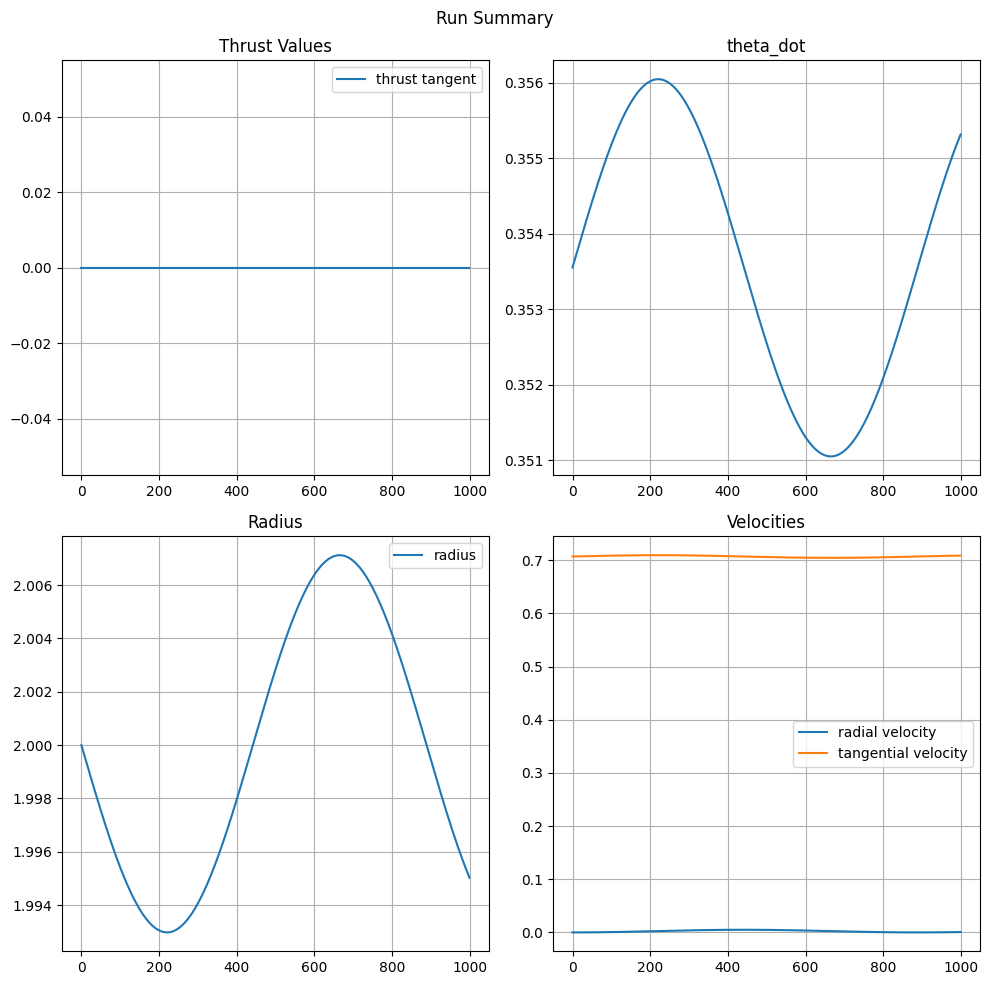

In [ ]:
class RocketAnimation(object):
    def __init__(self, r_min=0.1, r_target=1, r_max=10, xlim=(-10.2, 10.2), ylim=(-10.2, 10.2), markersize=10, circle_alpha=1, t_vec_len=1):
        self.r_min = r_min
        self.r_target = r_target
        self.r_max = r_max

        self.marker_size = markersize
        self.circle_alpha = circle_alpha
        self.t_vec_len = t_vec_len

        self.states = list()
        self.thrusts = list()
        # Note : I am not using requested_thrust for now, but I let it because I think it could be interesting
        self.requested_thrusts = list()
        self.theta_dot = list()

        #plots to verify the behavior of the actor critic
        self.rewards = list()
        self.action = list()

        # Wait why on earth is that a list ??
        self.rmin = list()
        self.rtarget = list()
        self.rmax = list()

        self.xlim = xlim
        self.ylim = ylim


    #No changes are made to this function
    def _circle(self, radius):
        theta = np.linspace(0, 2 * np.pi, 100)
        x, y = radius * np.cos(theta), radius * np.sin(theta)
        return x, y

    def _init(self,):
        self.ax.clear()

        self.arrow = Arrow(posA=(0, 0), posB=(0, 0), arrowstyle='simple', mutation_scale=5, color='r')
        self.ax.add_patch(self.arrow)
        self.line, = self.ax.plot([], [], marker='o', markersize=self.marker_size, alpha=self.circle_alpha)
        self.min_circle, = self.ax.plot(*self._circle(self.r_min), '--', label='Minimum Radius')
        self.start_circle, = self.ax.plot(*self._circle(2), '--', label='Starting Orbit', color='tab:orange') ##### TARGET = 2.0
        self.target_circle, = self.ax.plot(*self._circle(self.r_target), '--', label='Target Orbit')
        self.max_circle, = self.ax.plot(*self._circle(self.r_max), '--', label='Maximum Radius')
        self.ax.grid(True)
        self.ax.legend(loc='upper left')
        return self.line, self.min_circle, self.target_circle, self.max_circle


    def _animate(self, i):
        st = self.states[i]
        vec = self.thrusts[i] * self.t_vec_len * (self.xlim[1] - self.xlim[0])

        self.line.set_data([st[0]], [st[1]])
        self.min_circle.set_data(*self._circle(self.rmin[i]))
        self.target_circle.set_data(*self._circle(self.rtarget[i]))
        self.max_circle.set_data(*self._circle(self.rmax[i]))

        self.arrow.set_positions(posA=st[:2], posB=st[:2] + vec)
        self.fig.suptitle(f'Iteration: {i}')
        return self.line, self.min_circle, self.target_circle, self.max_circle

    def save_animation(self, name):
        self._transform_vectors()
        self.fig = plt.figure(figsize=(10, 10), num=1,
                              clear=True, tight_layout=True)
        self.ax = self.fig.add_subplot(111)
        anim = FuncAnimation(self.fig, self._animate, init_func=self._init, frames=len(
            self.states), blit=True, interval=100, repeat=False)
        anim.save(name, dpi=80)

    def _plot_thrust_magnitude(self, ax):
        ax.set_title('Thrust Magnitude')
        ax.plot(self.thrusts_norm, label='thrust magnitude')
        ax.plot(self.requested_thrusts_norm,
                    label='requested thrust magnitude')
        ax.grid(True)
        ax.legend()

    def _plot_thrust_value(self, ax):
        ax.set_title('Thrust Values')
        ax.plot([thrust[1]
                     for thrust in self.thrusts_polar], label='thrust tangent')
        ax.grid(True)
        ax.legend()

    def _plot_thrust_direction(self, ax):
        ax.set_title('Thrust Direction (Angle from $\hat{r}$)')
        ax.plot(self.thrust_direction, label='Thrust Direction')
        ax.plot(self.requested_thrust_direction,
                label='Requested Thrust Direction')
        ax.grid(True)
        ax.legend()

    def _plot_radius(self, ax):
        ax.set_title('Radius')
        ax.plot(self.rs, label='radius')
        ax.grid(True)
        ax.legend()

    def _plot_velocities(self, ax):
        ax.set_title('Velocities')
        ax.plot([vel[0] for vel in self.vel_polar], label='radial velocity')
        ax.plot([vel[1] for vel in self.vel_polar],
                label='tangential velocity')
        ax.grid(True)
        ax.legend()

    def _plot_theta_dot(self, ax):
      ax.set_title('theta_dot')
      ax.plot([theta for theta in self.theta_dot])
      ax.grid(True)

    def summary_plot(self):
        self._transform_vectors()
        print("It is creating a figure 1 ")
        self.fig1 = plt.figure(figsize=(10, 5), num=1,
                              clear=True, tight_layout=True)
        ax1 = self.fig1.add_subplot(221)
        ax2 = self.fig1.add_subplot(222)
        ax3 = self.fig1.add_subplot(223)
        ax4 = self.fig1.add_subplot(224)

        self.fig1.suptitle('Run Summary')


        self._plot_thrust_value(ax1)
        self._plot_theta_dot(ax2)
        self._plot_radius(ax3)
        self._plot_velocities(ax4)

        self.fig1.tight_layout()

        return self.fig1

    def show(self, name):
      self.save_animation(name)
      self.summary_plot()


    def _get_transforms(self, states):
        transforms = list()
        rs = list()
        thetas = list()

        for st in states:
            pos, vel = st[:2], st[2:]
            r = np.linalg.norm(pos)
            theta = np.arctan2(pos[1], pos[0])
            rhat = pos / r

            rot_mat = np.array([[rhat[0], -rhat[1]], [rhat[1], rhat[0]]])
            transforms.append(rot_mat)
            rs.append(r)
            thetas.append(theta)

        return transforms, rs, thetas

    def _forward_transform(self, transforms, vecs):
        return [tr @ vec for tr, vec in zip(transforms, vecs)]

    def _inverse_transform(self, transforms, vecs):
        return [tr.T @ vec for tr, vec in zip(transforms, vecs)]


    def _transform_vectors(self, ):
        transforms, self.rs, self.thetas = self._get_transforms(self.states)
        self.vel_polar = self._inverse_transform(
            transforms, [st[2:] for st in self.states])
        self.thrusts_polar = self._inverse_transform(transforms, self.thrusts)
        self.requested_thrusts_polar = self._inverse_transform(
            transforms, self.requested_thrusts)
        self.theta_dot = [v_tangential / r if r != 0 else 0 for v_tangential, r in zip([vel[1] for vel in self.vel_polar], self.rs)]
        self.thrusts_norm = [np.linalg.norm(thrust) for thrust in self.thrusts]
        self.requested_thrusts_norm = [np.linalg.norm(
            thrust) for thrust in self.requested_thrusts]
        self.thrust_direction = [np.arctan2(
            thrust[1], thrust[0]) for thrust in self.thrusts_polar]
        self.requested_thrust_direction = [np.arctan2(
            thrust[1], thrust[0]) for thrust in self.requested_thrusts_polar]

    def render(self, state, thrust, requested_thrust, rmin, rtarget, rmax):
        self.states.append(state)
        self.thrusts.append(thrust)
        self.requested_thrusts.append(requested_thrust)
        self.rmin.append(rmin)
        self.rtarget.append(rtarget)
        self.rmax.append(rmax)

    def return_arrays(self):
      return self.states, self.thrusts


def orbit_r2() -> Callable[[], List[np.float32]]:
  def func():
    r = 2
    theta = np.random.uniform(0, 2 * np.pi)
    rdot = 0
    v_dot = 1 / np.sqrt(r)

    pos = [r, 0]
    vel = [rdot, v_dot]
    rot_mat = np.array([[np.cos(theta), -np.sin(theta)],
                              [np.sin(theta), np.cos(theta)]])
    return [*(rot_mat @ pos), *(rot_mat @ vel)]
  return func

def make(name):
    init_func = orbit_r2()
    return RocketEnv(max_step=25_000, simulation_step=1, rmax=5, rmin=0.2,
            w_r = 10 , w_p = 10, w_t = 10,
            mode = "Ln", init_func=init_func,
            max_thrust=1, oob_penalty=0, dt=0.02)

env_name = 'RocketCircularization-v1' # env name to save model under
print("training environment name : " + env_name)
env = make(env_name)
env.max_step = 25_000
env.seed()
env = PolarizeObservation(env)
env = CTangentialThrust(env)

####### training procedure x10 regular dt #######
state = env.reset()
done = False
i = 0
while not done:
    env.render()
    state, reward, done, _ = env.step(torch.tensor([0]))
    i += 1
    done = done or i == 1_000

print(i)
env.show(path='test.mp4')
show_video('test.mp4')

##### $r=0.3$

<>:83: DeprecationWarning: invalid escape sequence '\h'
/usr/local/lib/python3.10/dist-packages/gym/spaces/box.py:128: UserWarning: WARN: Box bound precision lowered by casting to float32
  logger.warn(f"Box bound precision lowered by casting to {self.dtype}")
/usr/local/lib/python3.10/dist-packages/gym/core.py:256: DeprecationWarning: WARN: Function `env.seed(seed)` is marked as deprecated and will be removed in the future. Please use `env.reset(seed=seed)` instead.
  deprecation(
/usr/local/lib/python3.10/dist-packages/gym/core.py:317: DeprecationWarning: WARN: Initializing wrapper in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(


training environment name : RocketCircularization-v1
1000
It is creating a figure 1 


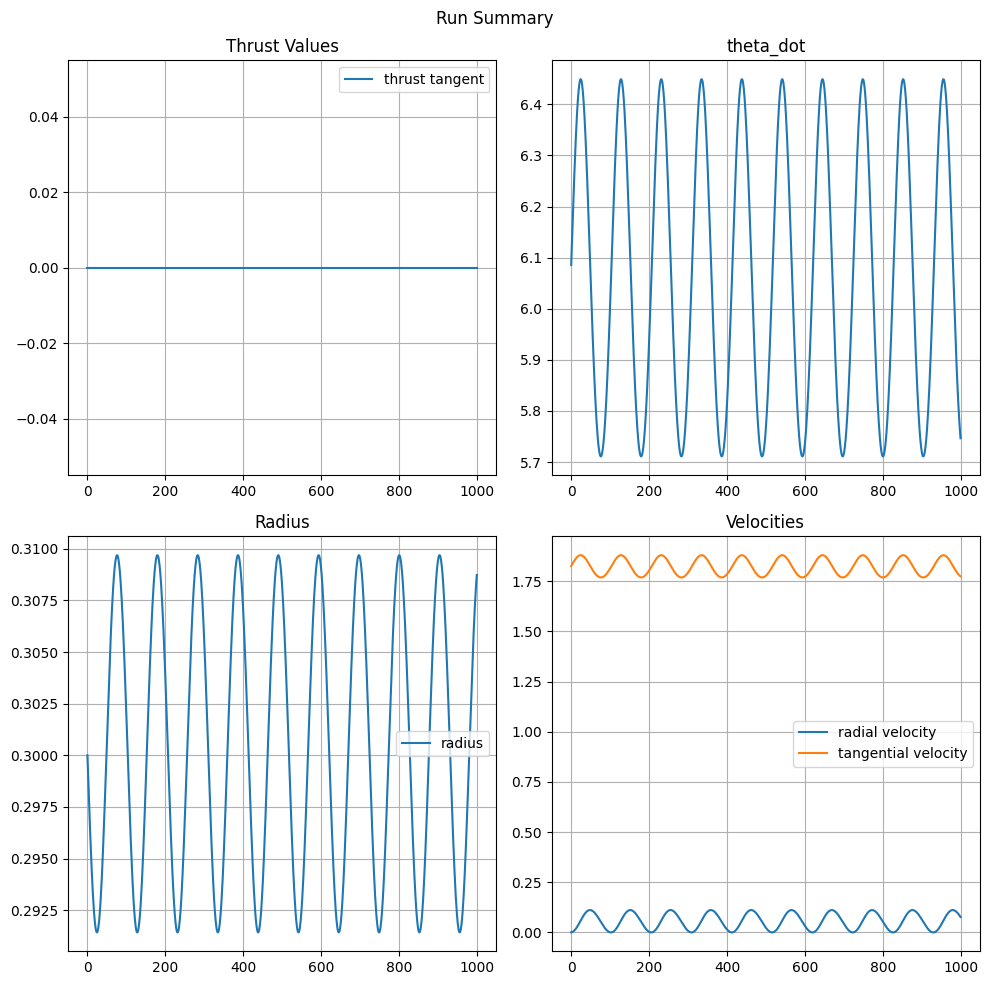

In [ ]:
class RocketAnimation(object):
    def __init__(self, r_min=0.1, r_target=1, r_max=10, xlim=(-10.2, 10.2), ylim=(-10.2, 10.2), markersize=10, circle_alpha=1, t_vec_len=1):
        self.r_min = r_min
        self.r_target = r_target
        self.r_max = r_max

        self.marker_size = markersize
        self.circle_alpha = circle_alpha
        self.t_vec_len = t_vec_len

        self.states = list()
        self.thrusts = list()
        self.requested_thrusts = list()
        self.theta_dot = list()

        self.rewards = list()
        self.action = list()

        self.rmin = list()
        self.rtarget = list()
        self.rmax = list()

        self.xlim = xlim
        self.ylim = ylim

    def _circle(self, radius):
        theta = np.linspace(0, 2 * np.pi, 100)
        x, y = radius * np.cos(theta), radius * np.sin(theta)
        return x, y

    def _init(self,):
        self.ax.clear()

        self.arrow = Arrow(posA=(0, 0), posB=(0, 0), arrowstyle='simple', mutation_scale=5, color='r')
        self.ax.add_patch(self.arrow)
        self.line, = self.ax.plot([], [], marker='o', markersize=self.marker_size, alpha=self.circle_alpha)
        self.min_circle, = self.ax.plot(*self._circle(self.r_min), '--', label='Minimum Radius')
        self.start_circle, = self.ax.plot(*self._circle(0.3), '--', label='Starting Orbit', color='tab:orange') ##### TARGET = 0.3
        self.target_circle, = self.ax.plot(*self._circle(self.r_target), '--', label='Target Orbit')
        self.max_circle, = self.ax.plot(*self._circle(self.r_max), '--', label='Maximum Radius')
        self.ax.grid(True)
        self.ax.legend(loc='upper left')
        return self.line, self.min_circle, self.target_circle, self.max_circle

    def _animate(self, i):
        st = self.states[i]
        vec = self.thrusts[i] * self.t_vec_len * (self.xlim[1] - self.xlim[0])

        self.line.set_data([st[0]], [st[1]])
        self.min_circle.set_data(*self._circle(self.rmin[i]))
        self.target_circle.set_data(*self._circle(self.rtarget[i]))
        self.max_circle.set_data(*self._circle(self.rmax[i]))

        self.arrow.set_positions(posA=st[:2], posB=st[:2] + vec)
        self.fig.suptitle(f'Iteration: {i}')
        return self.line, self.min_circle, self.target_circle, self.max_circle

    def save_animation(self, name):
        self._transform_vectors()
        self.fig = plt.figure(figsize=(10, 10), num=1,
                              clear=True, tight_layout=True)
        self.ax = self.fig.add_subplot(111)
        anim = FuncAnimation(self.fig, self._animate, init_func=self._init, frames=len(
            self.states), blit=True, interval=100, repeat=False)
        anim.save(name, dpi=80)

    def _plot_thrust_magnitude(self, ax):
        ax.set_title('Thrust Magnitude')
        ax.plot(self.thrusts_norm, label='thrust magnitude')
        ax.plot(self.requested_thrusts_norm,
                    label='requested thrust magnitude')
        ax.grid(True)
        ax.legend()

    def _plot_thrust_value(self, ax):
        ax.set_title('Thrust Values')
        ax.plot([thrust[1]
                     for thrust in self.thrusts_polar], label='thrust tangent')
        ax.grid(True)
        ax.legend()

    def _plot_thrust_direction(self, ax):
        ax.set_title('Thrust Direction (Angle from $\hat{r}$)')
        ax.plot(self.thrust_direction, label='Thrust Direction')
        ax.plot(self.requested_thrust_direction,
                label='Requested Thrust Direction')
        ax.grid(True)
        ax.legend()

    def _plot_radius(self, ax):
        ax.set_title('Radius')
        ax.plot(self.rs, label='radius')
        ax.grid(True)
        ax.legend()

    def _plot_velocities(self, ax):
        ax.set_title('Velocities')
        ax.plot([vel[0] for vel in self.vel_polar], label='radial velocity')
        ax.plot([vel[1] for vel in self.vel_polar],
                label='tangential velocity')
        ax.grid(True)
        ax.legend()

    def _plot_theta_dot(self, ax):
      ax.set_title('theta_dot')
      ax.plot([theta for theta in self.theta_dot])
      ax.grid(True)

    def summary_plot(self):
        self._transform_vectors()
        print("It is creating a figure 1 ")
        self.fig1 = plt.figure(figsize=(10, 5), num=1,
                              clear=True, tight_layout=True)
        ax1 = self.fig1.add_subplot(221)
        ax2 = self.fig1.add_subplot(222)
        ax3 = self.fig1.add_subplot(223)
        ax4 = self.fig1.add_subplot(224)

        self.fig1.suptitle('Run Summary')


        self._plot_thrust_value(ax1)
        self._plot_theta_dot(ax2)
        self._plot_radius(ax3)
        self._plot_velocities(ax4)

        self.fig1.tight_layout()

        return self.fig1

    def show(self, name):
      self.save_animation(name)
      self.summary_plot()


    def _get_transforms(self, states):
        transforms = list()
        rs = list()
        thetas = list()

        for st in states:
            pos, vel = st[:2], st[2:]
            r = np.linalg.norm(pos)
            theta = np.arctan2(pos[1], pos[0])
            rhat = pos / r

            rot_mat = np.array([[rhat[0], -rhat[1]], [rhat[1], rhat[0]]])
            transforms.append(rot_mat)
            rs.append(r)
            thetas.append(theta)

        return transforms, rs, thetas

    def _forward_transform(self, transforms, vecs):
        return [tr @ vec for tr, vec in zip(transforms, vecs)]

    def _inverse_transform(self, transforms, vecs):
        return [tr.T @ vec for tr, vec in zip(transforms, vecs)]


    def _transform_vectors(self, ):
        transforms, self.rs, self.thetas = self._get_transforms(self.states)
        self.vel_polar = self._inverse_transform(
            transforms, [st[2:] for st in self.states])
        self.thrusts_polar = self._inverse_transform(transforms, self.thrusts)
        self.requested_thrusts_polar = self._inverse_transform(
            transforms, self.requested_thrusts)
        self.theta_dot = [v_tangential / r if r != 0 else 0 for v_tangential, r in zip([vel[1] for vel in self.vel_polar], self.rs)]
        self.thrusts_norm = [np.linalg.norm(thrust) for thrust in self.thrusts]
        self.requested_thrusts_norm = [np.linalg.norm(
            thrust) for thrust in self.requested_thrusts]
        self.thrust_direction = [np.arctan2(
            thrust[1], thrust[0]) for thrust in self.thrusts_polar]
        self.requested_thrust_direction = [np.arctan2(
            thrust[1], thrust[0]) for thrust in self.requested_thrusts_polar]

    def render(self, state, thrust, requested_thrust, rmin, rtarget, rmax):
        self.states.append(state)
        self.thrusts.append(thrust)
        self.requested_thrusts.append(requested_thrust)
        self.rmin.append(rmin)
        self.rtarget.append(rtarget)
        self.rmax.append(rmax)

    def return_arrays(self):
      return self.states, self.thrusts

def orbit_rpoint3() -> Callable[[], List[np.float32]]:
  def func():
    r = 0.3
    theta = np.random.uniform(0, 2 * np.pi)
    rdot = 0
    v_dot = 1 / np.sqrt(r)

    pos = [r, 0]
    vel = [rdot, v_dot]
    rot_mat = np.array([[np.cos(theta), -np.sin(theta)],
                              [np.sin(theta), np.cos(theta)]])
    return [*(rot_mat @ pos), *(rot_mat @ vel)]
  return func


def make(name):
    init_func = orbit_rpoint3()
    return RocketEnv(max_step=25_000, simulation_step=1, rmax=5, rmin=0.2,
            w_r = 10 , w_p = 10, w_t = 10,
            mode = "Ln", init_func=init_func,
            max_thrust=1, oob_penalty=0, dt=0.01)

env_name = 'RocketCircularization-v1' # env name to save model under
print("training environment name : " + env_name)
env = make(env_name)
env.max_step = 25_000
env.seed()
env = PolarizeObservation(env)
env = CTangentialThrust(env)

####### training procedure x10 dt #######
state = env.reset()
done = False
i = 0
while not done:
    env.render()
    state, reward, done, _ = env.step(torch.tensor([0]))
    i += 1
    done = done or i == 1_000

print(i)
env.show(path='test.mp4')
show_video('test.mp4')

### Getting from other $R$'s to $R=1$

#### Trained on r = [0.7, 1.3]

##### {1.5, 6, 9}

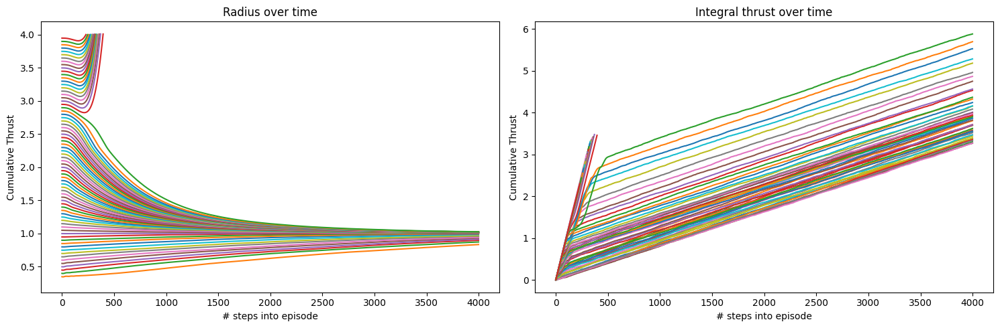

3.95-- [2.2910495] 230

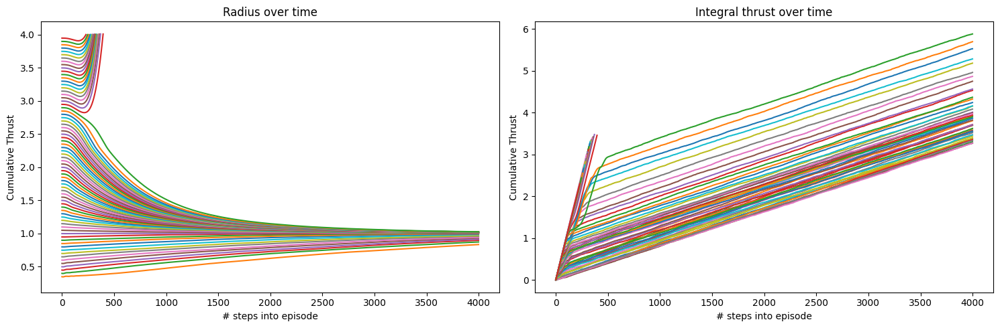

In [ ]:
### Trained on 0.7-1.3
### Tested on 0.3-4.0

def orbit1_1(r) -> Callable[[], List[np.float32]]:
  def func():
    theta = np.random.uniform(0, 2 * np.pi)
    rdot = 0
    v_dot = 1 / np.sqrt(r)

    pos = [r, 0]
    vel = [rdot, v_dot]
    rot_mat = np.array([[np.cos(theta), -np.sin(theta)],
                              [np.sin(theta), np.cos(theta)]])
    return [*(rot_mat @ pos), *(rot_mat @ vel)]
  return func


rmin = 0.7
rmax = 1.3
mode = "Ln"
w_t = 1.5
w_r = 6
w_p = 9
num = "1"
max_ep_len = 25_000
max_training_timesteps = 20_000_000
dt = 0.01

################# training procedure ################

# initialize a PPO agent
ppo_agent = PPO(3, 1, 1e-3, 2e-3, 0.9998, 80, 0.2, True, 0.1)
ppo_agent.load("/content/general_navtor1-5.pth")

rs_list = []
actions_list = []
labels = [round(r, 3) for r in np.arange(0.3, 4, 0.05)]
for r in labels:
  init_func = orbit1_1(r)
  env = RocketEnv(max_step=25_000, simulation_step=1, rmax=4.0, rmin=0.3,
              w_r = w_r , w_p = w_p, w_t = w_t,
              mode = "Ln", init_func=init_func,
              max_thrust=1, oob_penalty=0, dt = dt)
  env = PolarizeObservation(env)
  env = CTangentialThrust(env)

  state = env.reset()
  done = False
  i = 0
  r_list = []
  old_action = 0
  action_list = []
  while not done:
      print(f"\r{r}-- {old_action} {i}", end="")
      env.render()
      action = ppo_agent.select_action(state, 1, -1)
      state, reward, done, _ = env.step(action)
      r_list.append(state[0])
      action_list.append(old_action + np.abs(action*dt))
      old_action += np.abs(action*dt)
      i += 1
      done = done or i == 4_000
  rs_list.append(r_list)
  actions_list.append(action_list)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

for i in range(len(rs_list)):
    ax1.plot(np.arange(len(rs_list[i])), rs_list[i])
ax1.set_title('Radius over time')
ax1.set_xlabel("# steps into episode")
ax1.set_ylabel("Cumulative Thrust")

for i in range(len(actions_list)):
    ax2.plot(np.arange(len(actions_list[i])), actions_list[i])
ax2.set_title('Integral thrust over time')
ax2.set_xlabel('# steps into episode')
ax2.set_ylabel('Cumulative Thrust')

plt.tight_layout()
plt.show()

##### {0.5, 10, 10}

/usr/local/lib/python3.10/dist-packages/gym/spaces/box.py:128: UserWarning:

WARN: Box bound precision lowered by casting to float32

/usr/local/lib/python3.10/dist-packages/gym/core.py:317: DeprecationWarning:

WARN: Initializing wrapper in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.



3.95-- [5.648098] 3999

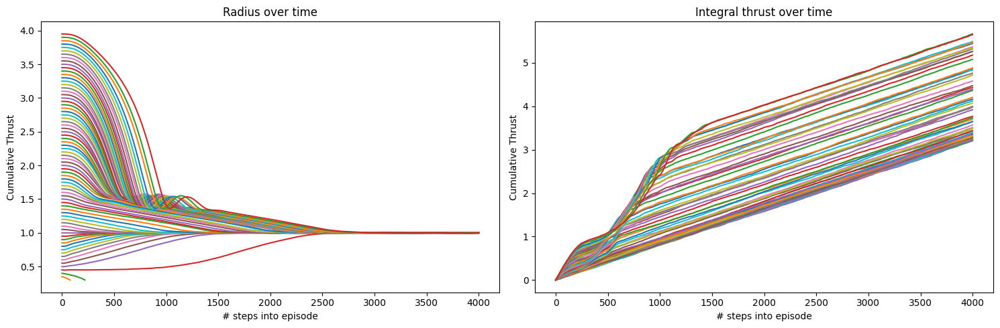

In [ ]:
### Trained on 0.7-1.3
### Tested on 0.3-4.0

def orbit1_1(r) -> Callable[[], List[np.float32]]:
  def func():
    theta = np.random.uniform(0, 2 * np.pi)
    rdot = 0
    v_dot = 1 / np.sqrt(r)

    pos = [r, 0]
    vel = [rdot, v_dot]
    rot_mat = np.array([[np.cos(theta), -np.sin(theta)],
                        [np.sin(theta), np.cos(theta)]])
    return [*(rot_mat @ pos), *(rot_mat @ vel)]
  return func


rmin = 0.7
rmax = 1.3
mode = "Ln"
w_t = 0.5
w_r = 10
w_p = 10
num = "1"
max_ep_len = 25_000
max_training_timesteps = 20_000_000
dt = 0.01

################# training procedure ################

# initialize a PPO agent
ppo_agent = PPO(3, 1, 1e-3, 2e-3, 0.9998, 80, 0.2, True, 0.1)
ppo_agent.load("/content/general_navtor1-8.pth")

rs_list = []
actions_list = []
labels = [round(r, 3) for r in np.arange(0.3, 4, 0.05)]
for r in labels:
  init_func = orbit1_1(r)
  env = RocketEnv(max_step=25_000, simulation_step=1, rmax=4.0, rmin=0.3,
              w_r = w_r , w_p = w_p, w_t = w_t,
              mode = "Ln", init_func=init_func,
              max_thrust=1, oob_penalty=0, dt = dt)
  env = PolarizeObservation(env)
  env = CTangentialThrust(env)

  state = env.reset()
  done = False
  i = 0
  r_list = []
  old_action = 0
  action_list = []
  while not done:
      print(f"\r{r}-- {old_action} {i}", end="")
      env.render()
      action = ppo_agent.select_action(state, 1, -1)
      state, reward, done, _ = env.step(action)
      r_list.append(state[0])
      action_list.append(old_action + np.abs(action*dt))
      old_action += np.abs(action*dt)
      i += 1
      done = done or i == 4_000
  rs_list.append(r_list)
  actions_list.append(action_list)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

for i in range(len(rs_list)):
    ax1.plot(np.arange(len(rs_list[i])), rs_list[i])
ax1.set_title('Radius over time')
ax1.set_xlabel("# steps into episode")
ax1.set_ylabel("Cumulative Thrust")

for i in range(len(actions_list)):
    ax2.plot(np.arange(len(actions_list[i])), actions_list[i])
ax2.set_title('Integral thrust over time')
ax2.set_xlabel('# steps into episode')
ax2.set_ylabel('Cumulative Thrust')

plt.tight_layout()
plt.show()

##### {1, 10, 10}

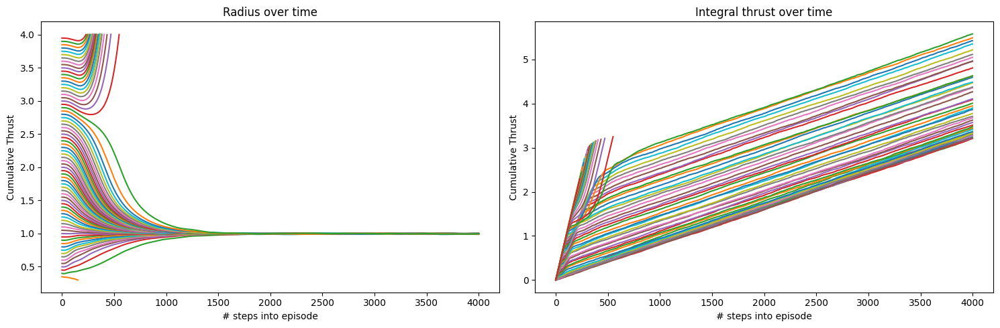

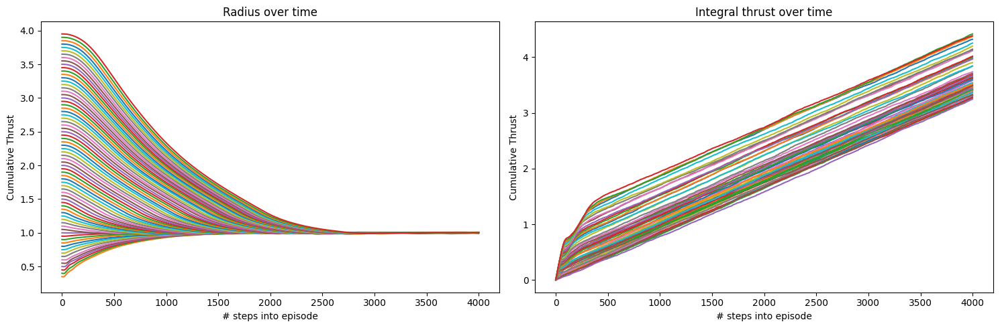

###### [0.7 - 1.3]

3.95-- [2.2927403] 229

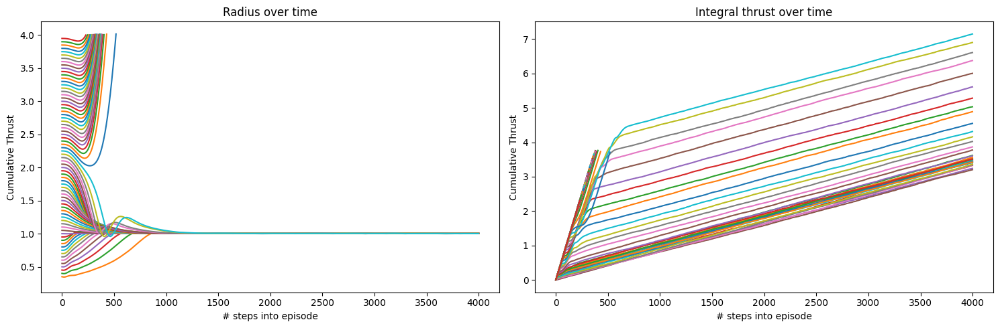

208
It is creating a figure 1 


/usr/local/lib/python3.10/dist-packages/gym/spaces/box.py:128: UserWarning:

WARN: Box bound precision lowered by casting to float32

/usr/local/lib/python3.10/dist-packages/gym/core.py:317: DeprecationWarning:

WARN: Initializing wrapper in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.



4000
It is creating a figure 1 


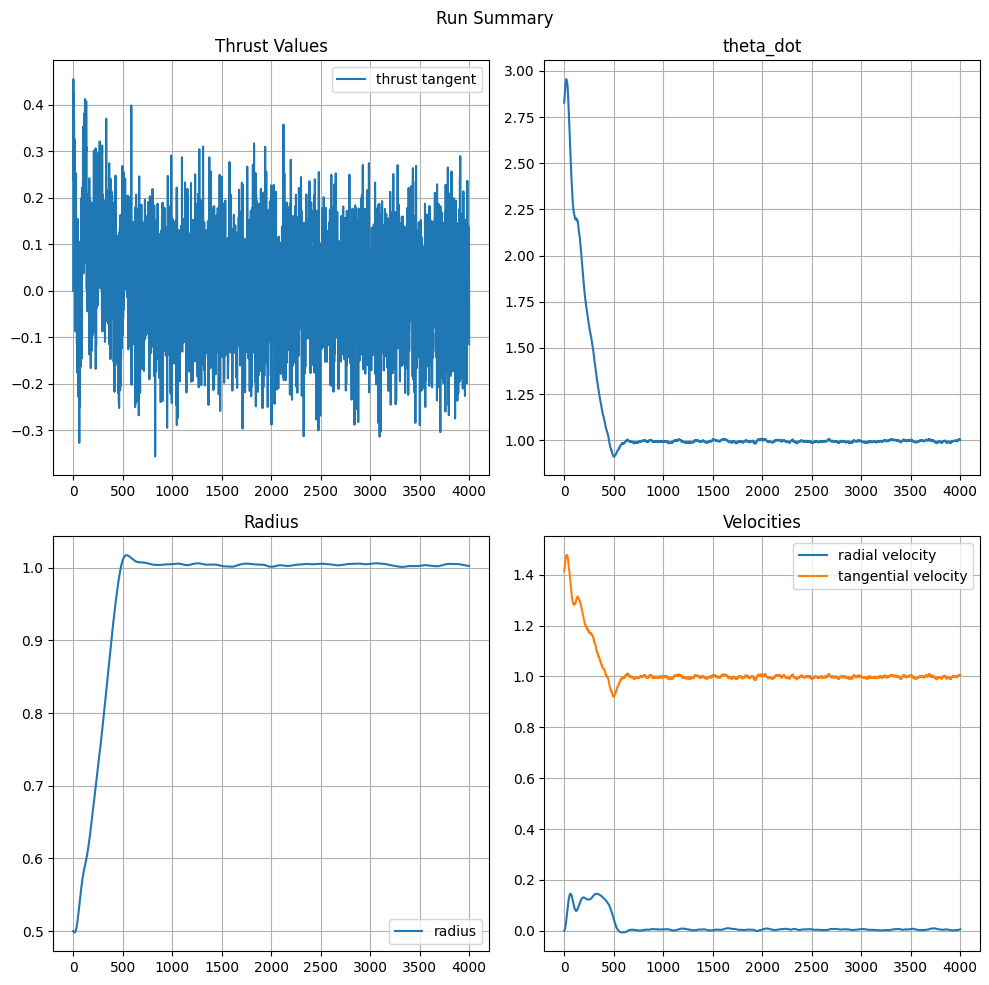

In [ ]:
### Trained on 0.7-1.3
### Tested on 0.3-4.0

def orbit1_1(r) -> Callable[[], List[np.float32]]:
  def func():
    theta = np.random.uniform(0, 2 * np.pi)
    rdot = 0
    v_dot = 1 / np.sqrt(r)

    pos = [r, 0]
    vel = [rdot, v_dot]
    rot_mat = np.array([[np.cos(theta), -np.sin(theta)],
                        [np.sin(theta), np.cos(theta)]])
    return [*(rot_mat @ pos), *(rot_mat @ vel)]
  return func

rmin = 0.3
rmax = 4.0
mode = "Ln"
w_t = 1
w_r = 10
w_p = 10
num = "1"
max_ep_len = 25_000
max_training_timesteps = 20_000_000
dt = 0.01
ppo_agent = PPO(3, 1, 1e-3, 2e-3, 0.9998, 80, 0.2, True, 0.1)
ppo_agent.load("/content/general_navtor1-6.pth")


# PLOT RADIUS & CUMULATIVE THRUST FROM VARYING RADII
rs_list = []
actions_list = []
labels = [round(r, 3) for r in np.arange(0.3, 4, 0.05)]
for r in labels:
  init_func = orbit1_1(r)
  env = RocketEnv(max_step=25_000, simulation_step=1, rmax=rmax, rmin=rmin,
              w_r = w_r , w_p = w_p, w_t = w_t,
              mode = "Ln", init_func=init_func,
              max_thrust=1, oob_penalty=0, dt = dt)
  env = PolarizeObservation(env)
  env = CTangentialThrust(env)

  state = env.reset()
  done = False
  i = 0
  r_list = []
  old_action = 0
  action_list = []
  while not done:
      print(f"\r{r}-- {old_action} {i}", end="")
      env.render()
      action = ppo_agent.select_action(state, 1, -1)
      state, reward, done, _ = env.step(action)
      r_list.append(state[0])
      action_list.append(old_action + np.abs(action*dt))
      old_action += np.abs(action*dt)
      i += 1
      done = done or i == 4_000
  rs_list.append(r_list)
  actions_list.append(action_list)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

for i in range(len(rs_list)):
    ax1.plot(np.arange(len(rs_list[i])), rs_list[i])
ax1.plot(np.arange(len(rs_list[0])), [0.7 for _ in range(len(rs_list[0]))], linestyle="dotted", color="black")
ax1.plot(np.arange(len(rs_list[0])), [1.7 for _ in range(len(rs_list[0]))], linestyle="dotted", color="black")
ax1.set_title('Radius over time')
ax1.set_xlabel("# steps into episode")
ax1.set_ylabel("Cumulative Thrust")

for i in range(len(actions_list)):
    ax2.plot(np.arange(len(actions_list[i])), actions_list[i])
ax2.set_title('Integral thrust over time')
ax2.set_xlabel('# steps into episode')
ax2.set_ylabel('Cumulative Thrust')

plt.tight_layout()
plt.show()

# RUN A EPISODE FROM R=4
init_func = orbit1_1(4)
env = RocketEnv(max_step=25_000, simulation_step=1, rmax=rmax, rmin=rmin,
            w_r = w_r , w_p = w_p, w_t = w_t,
            mode = "Ln", init_func=init_func,
            max_thrust=1, oob_penalty=0, dt = dt)
env = PolarizeObservation(env)
env = CTangentialThrust(env)
state = env.reset()
done = False
i = 0
while not done:
    env.render()
    action = ppo_agent.select_action(state, 1, -1)
    state, reward, done, _ = env.step(action)
    i += 1
    done = done or i == 4_000

print(i)
env.show(path='test_at_r4.mp4')
show_video('test_at_r4.mp4')

# RUN A EPISODE FROM R=0.5
init_func = orbit1_1(0.5)
env = RocketEnv(max_step=25_000, simulation_step=1, rmax=rmax, rmin=rmin,
            w_r = w_r , w_p = w_p, w_t = w_t,
            mode = "Ln", init_func=init_func,
            max_thrust=1, oob_penalty=0, dt = dt)
env = PolarizeObservation(env)
env = CTangentialThrust(env)
state = env.reset()
done = False
i = 0
while not done:
    env.render()
    action = ppo_agent.select_action(state, 1, -1)
    state, reward, done, _ = env.step(action)
    i += 1
    done = done or i == 4_000

print(i)
env.show(path='test_at_rpoint5.mp4')
show_video('test_at_rpoint5.mp4')

###### [0.3-4.0]

/usr/local/lib/python3.10/dist-packages/gym/spaces/box.py:128: UserWarning:

WARN: Box bound precision lowered by casting to float32

/usr/local/lib/python3.10/dist-packages/gym/core.py:317: DeprecationWarning:

WARN: Initializing wrapper in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.



3.95-- [4.651333] 3999

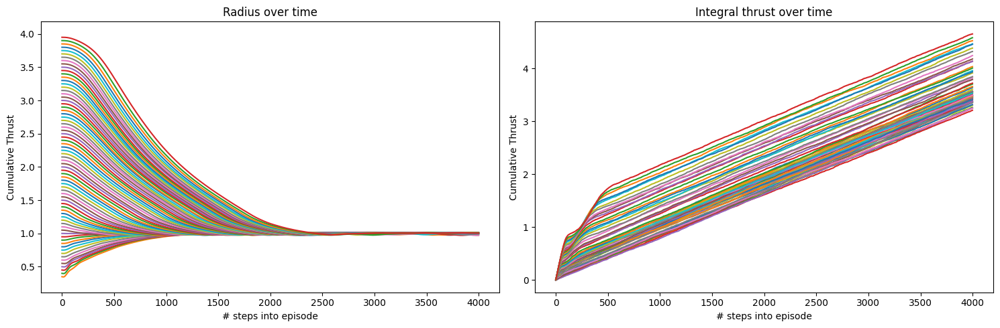

In [ ]:
### Trained on 0.3-4.0
### Tested on 0.3-4.0

def orbit1_1(r) -> Callable[[], List[np.float32]]:
  def func():
    theta = np.random.uniform(0, 2 * np.pi)
    rdot = 0
    v_dot = 1 / np.sqrt(r)

    pos = [r, 0]
    vel = [rdot, v_dot]
    rot_mat = np.array([[np.cos(theta), -np.sin(theta)],
                        [np.sin(theta), np.cos(theta)]])
    return [*(rot_mat @ pos), *(rot_mat @ vel)]
  return func

rmin = 0.3
rmax = 4.0
mode = "Ln"
w_t = 1
w_r = 10
w_p = 10
num = "1"
max_ep_len = 25_000
max_training_timesteps = 20_000_000
dt = 0.01
ppo_agent = PPO(3, 1, 1e-3, 2e-3, 0.9998, 80, 0.2, True, 0.1)
ppo_agent.load("/content/general_navtor1-6-2.pth")


# PLOT RADIUS & CUMULATIVE THRUST FROM VARYING RADII
rs_list = []
actions_list = []
labels = [round(r, 3) for r in np.arange(0.3, 4, 0.05)]
for r in labels:
  init_func = orbit1_1(r)
  env = RocketEnv(max_step=25_000, simulation_step=1, rmax=rmax, rmin=rmin,
              w_r = w_r , w_p = w_p, w_t = w_t,
              mode = "Ln", init_func=init_func,
              max_thrust=1, oob_penalty=0, dt = dt)
  env = PolarizeObservation(env)
  env = CTangentialThrust(env)

  state = env.reset()
  done = False
  i = 0
  r_list = []
  old_action = 0
  action_list = []
  while not done:
      print(f"\r{r}-- {old_action} {i}", end="")
      env.render()
      action = ppo_agent.select_action(state, 1, -1)
      state, reward, done, _ = env.step(action)
      r_list.append(state[0])
      action_list.append(old_action + np.abs(action*dt))
      old_action += np.abs(action*dt)
      i += 1
      done = done or i == 4_000
  rs_list.append(r_list)
  actions_list.append(action_list)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

for i in range(len(rs_list)):
    ax1.plot(np.arange(len(rs_list[i])), rs_list[i])
ax1.plot(np.arange(len(rs_list[0])), [0.3 for _ in range(len(rs_list[0]))], linestyle="dotted", color="black")
ax1.plot(np.arange(len(rs_list[0])), [4.0 for _ in range(len(rs_list[0]))], linestyle="dotted", color="black")
ax1.set_title('Radius over time')
ax1.set_xlabel("# steps into episode")
ax1.set_ylabel("Cumulative Thrust")

for i in range(len(actions_list)):
    ax2.plot(np.arange(len(actions_list[i])), actions_list[i])
ax2.set_title('Integral thrust over time')
ax2.set_xlabel('# steps into episode')
ax2.set_ylabel('Cumulative Thrust')

plt.tight_layout()
plt.show()

4000
It is creating a figure 1 


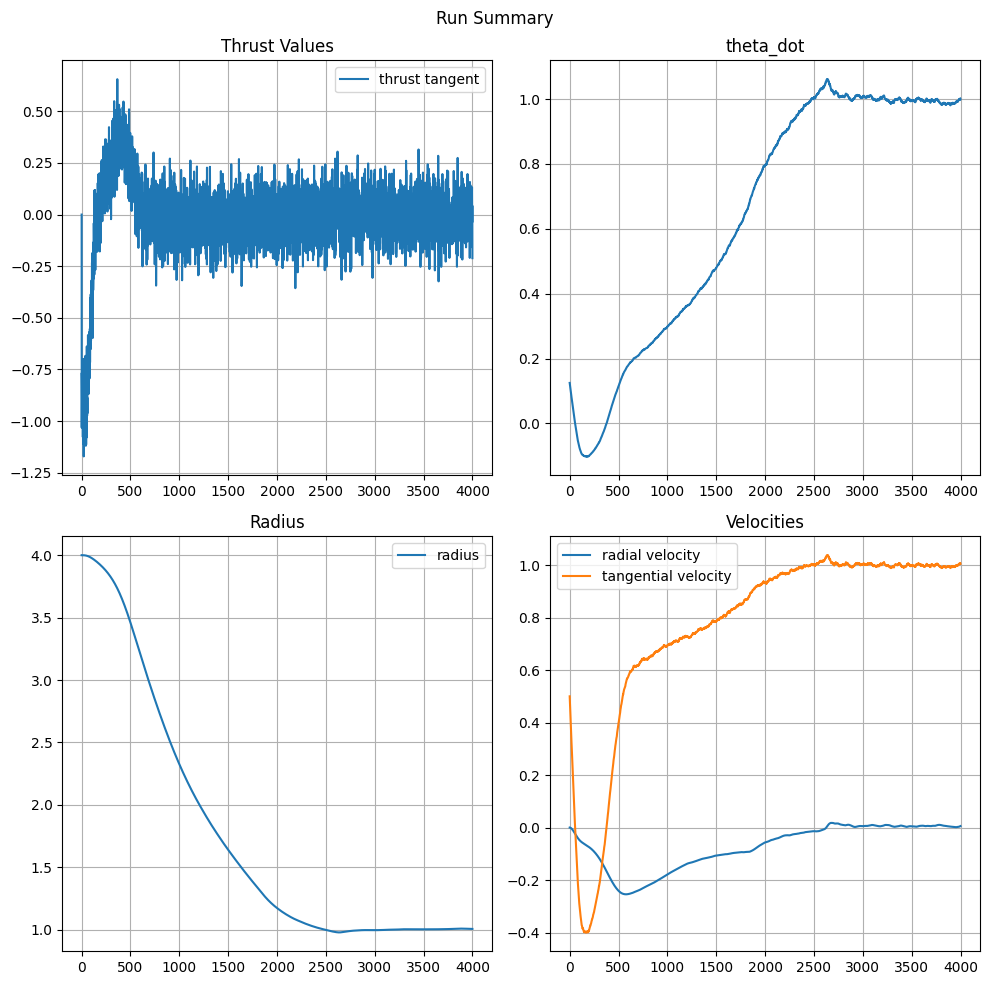

In [ ]:
# RUN A EPISODE FROM R=4
init_func = orbit1_1(4)
env = RocketEnv(max_step=25_000, simulation_step=1, rmax=rmax, rmin=rmin,
            w_r = w_r , w_p = w_p, w_t = w_t,
            mode = "Ln", init_func=init_func,
            max_thrust=1, oob_penalty=0, dt = dt)
env = PolarizeObservation(env)
env = CTangentialThrust(env)
state = env.reset()
done = False
i = 0
while not done:
    env.render()
    action = ppo_agent.select_action(state, 1, -1)

    state, reward, done, _ = env.step(action)
    i += 1
    done = done or i == 4_000

print(i)
env.show(path='test_at_r4.mp4')
show_video('test_at_r4.mp4')

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.

/usr/local/lib/python3.10/dist-packages/gym/spaces/box.py:128: UserWarning:

WARN: Box bound precision lowered by casting to float32

/usr/local/lib/python3.10/dist-packages/gym/core.py:317: DeprecationWarning:

WARN: Initializing wrapper in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.



4000
It is creating a figure 1 


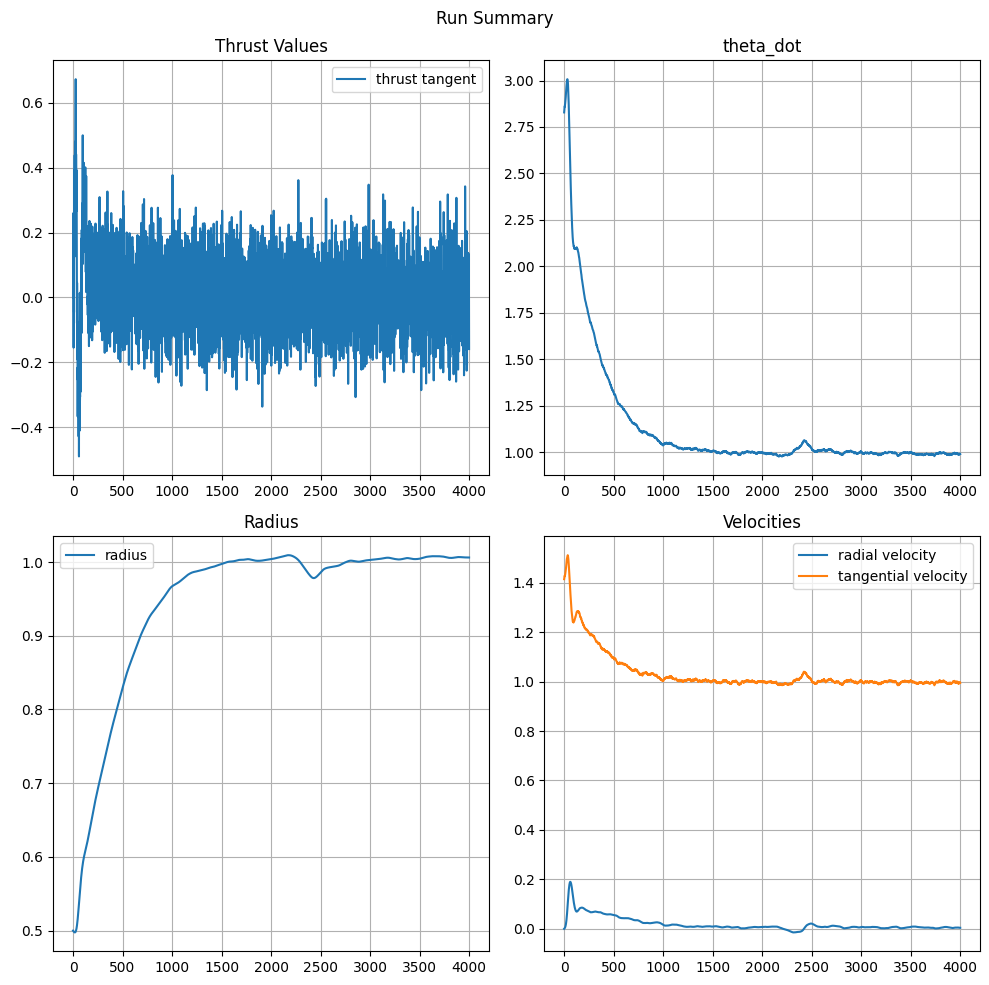

In [ ]:
# RUN A EPISODE FROM R=0.5
init_func = orbit1_1(0.5)
env = RocketEnv(max_step=25_000, simulation_step=1, rmax=rmax, rmin=rmin,
            w_r = w_r , w_p = w_p, w_t = w_t,
            mode = "Ln", init_func=init_func,
            max_thrust=1, oob_penalty=0, dt = dt)
env = PolarizeObservation(env)
env = CTangentialThrust(env)
state = env.reset()
done = False
i = 0
while not done:
    env.render()
    action = ppo_agent.select_action(state, 1, -1)
    state, reward, done, _ = env.step(action)
    i += 1
    done = done or i == 4_000

print(i)
env.show(path='test_at_rpoint5.mp4')
show_video('test_at_rpoint5.mp4')

##### {2, 10, 10}

3.95-- [2.2776327] 232

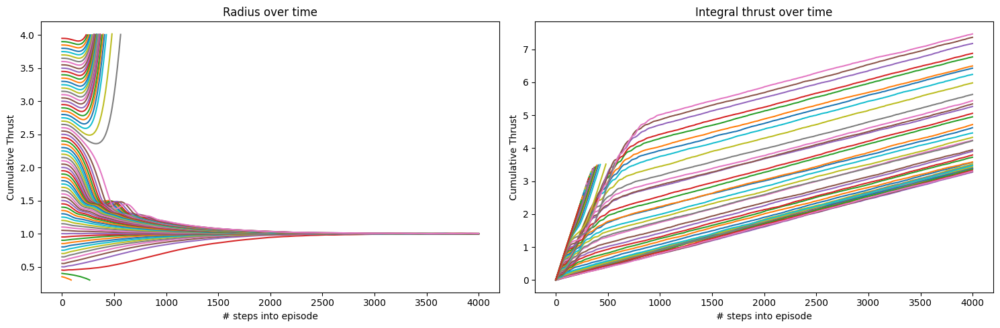

In [ ]:
### Trained on 0.7-1.3
### Tested on 0.3-4.0

def orbit1_1(r) -> Callable[[], List[np.float32]]:
  def func():
    theta = np.random.uniform(0, 2 * np.pi)
    rdot = 0
    v_dot = 1 / np.sqrt(r)

    pos = [r, 0]
    vel = [rdot, v_dot]
    rot_mat = np.array([[np.cos(theta), -np.sin(theta)],
                        [np.sin(theta), np.cos(theta)]])
    return [*(rot_mat @ pos), *(rot_mat @ vel)]
  return func


rmin = 0.7
rmax = 1.3
mode = "Ln"
w_t = 2
w_r = 10
w_p = 10
num = "1"
max_ep_len = 25_000
max_training_timesteps = 20_000_000
dt = 0.01

################# training procedure ################

# initialize a PPO agent
ppo_agent = PPO(3, 1, 1e-3, 2e-3, 0.9998, 80, 0.2, True, 0.1)
ppo_agent.load("/content/general_navtor1-7.pth")

rs_list = []
actions_list = []
labels = [round(r, 3) for r in np.arange(0.3, 4, 0.05)]
for r in labels:
  init_func = orbit1_1(r)
  env = RocketEnv(max_step=25_000, simulation_step=1, rmax=4.0, rmin=0.3,
              w_r = w_r , w_p = w_p, w_t = w_t,
              mode = "Ln", init_func=init_func,
              max_thrust=1, oob_penalty=0, dt = dt)
  env = PolarizeObservation(env)
  env = CTangentialThrust(env)

  state = env.reset()
  done = False
  i = 0
  r_list = []
  old_action = 0
  action_list = []
  while not done:
      print(f"\r{r}-- {old_action} {i}", end="")
      env.render()
      action = ppo_agent.select_action(state, 1, -1)
      state, reward, done, _ = env.step(action)
      r_list.append(state[0])
      action_list.append(old_action + np.abs(action*dt))
      old_action += np.abs(action*dt)
      i += 1
      done = done or i == 4_000
  rs_list.append(r_list)
  actions_list.append(action_list)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

for i in range(len(rs_list)):
    ax1.plot(np.arange(len(rs_list[i])), rs_list[i])
ax1.set_title('Radius over time')
ax1.set_xlabel("# steps into episode")
ax1.set_ylabel("Cumulative Thrust")

for i in range(len(actions_list)):
    ax2.plot(np.arange(len(actions_list[i])), actions_list[i])
ax2.set_title('Integral thrust over time')
ax2.set_xlabel('# steps into episode')
ax2.set_ylabel('Cumulative Thrust')

plt.tight_layout()
plt.show()

##### {3, 10, 10}

3.95-- [2.215305] 241

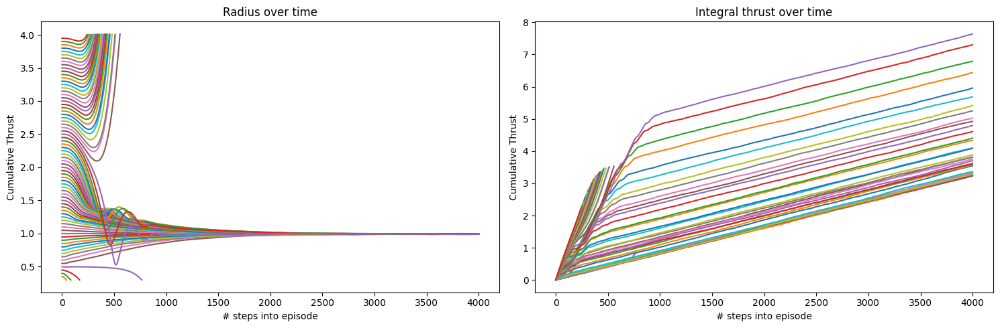

In [ ]:
### Trained on 0.7-1.3
### Tested on 0.3-4.0

def orbit1_1(r) -> Callable[[], List[np.float32]]:
  def func():
    theta = np.random.uniform(0, 2 * np.pi)
    rdot = 0
    v_dot = 1 / np.sqrt(r)

    pos = [r, 0]
    vel = [rdot, v_dot]
    rot_mat = np.array([[np.cos(theta), -np.sin(theta)],
                              [np.sin(theta), np.cos(theta)]])
    return [*(rot_mat @ pos), *(rot_mat @ vel)]
  return func


rmin = 0.7
rmax = 1.3
mode = "Ln"
w_t = 3
w_r = 10
w_p = 10
num = "1"
max_ep_len = 25_000
max_training_timesteps = 20_000_000
dt = 0.01

################# training procedure ################

# initialize a PPO agent
ppo_agent = PPO(3, 1, 1e-3, 2e-3, 0.9998, 80, 0.2, True, 0.1)
ppo_agent.load("/content/general_navtor1-4.pth")

rs_list = []
actions_list = []
labels = [round(r, 3) for r in np.arange(0.3, 4, 0.05)]
for r in labels:
  init_func = orbit1_1(r)
  env = RocketEnv(max_step=25_000, simulation_step=1, rmax=4.0, rmin=0.3,
              w_r = w_r , w_p = w_p, w_t = w_t,
              mode = "Ln", init_func=init_func,
              max_thrust=1, oob_penalty=0, dt = dt)
  env = PolarizeObservation(env)
  env = CTangentialThrust(env)

  state = env.reset()
  done = False
  i = 0
  r_list = []
  old_action = 0
  action_list = []
  while not done:
      print(f"\r{r}-- {old_action} {i}", end="")
      env.render()
      action = ppo_agent.select_action(state, 1, -1)
      state, reward, done, _ = env.step(action)
      r_list.append(state[0])
      action_list.append(old_action + np.abs(action*dt))
      old_action += np.abs(action*dt)
      i += 1
      done = done or i == 4_000
  rs_list.append(r_list)
  actions_list.append(action_list)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

for i in range(len(rs_list)):
    ax1.plot(np.arange(len(rs_list[i])), rs_list[i])
ax1.set_title('Radius over time')
ax1.set_xlabel("# steps into episode")
ax1.set_ylabel("Cumulative Thrust")

for i in range(len(actions_list)):
    ax2.plot(np.arange(len(actions_list[i])), actions_list[i])
ax2.set_title('Integral thrust over time')
ax2.set_xlabel('# steps into episode')
ax2.set_ylabel('Cumulative Thrust')

plt.tight_layout()
plt.show()

##### {10, 10, 10}

3.95-- [0.21945287] 237

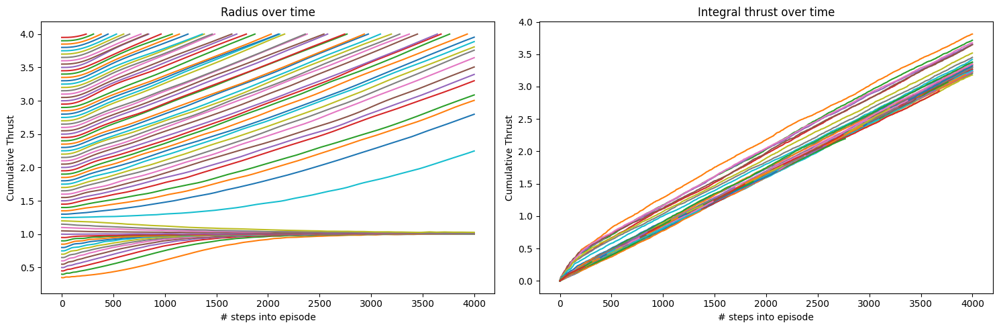

In [ ]:
### Trained on 0.7-1.3
### Tested on 0.3-4.0

def orbit1_1(r) -> Callable[[], List[np.float32]]:
  def func():
    theta = np.random.uniform(0, 2 * np.pi)
    rdot = 0
    v_dot = 1 / np.sqrt(r)

    pos = [r, 0]
    vel = [rdot, v_dot]
    rot_mat = np.array([[np.cos(theta), -np.sin(theta)],
                              [np.sin(theta), np.cos(theta)]])
    return [*(rot_mat @ pos), *(rot_mat @ vel)]
  return func


rmin = 0.7
rmax = 1.3
mode = "Ln"
w_t = 10
w_r = 10
w_p = 10
num = "1"
max_ep_len = 25_000
max_training_timesteps = 20_000_000
dt = 0.01

################# training procedure ################

# initialize a PPO agent
ppo_agent = PPO(3, 1, 1e-3, 2e-3, 0.9998, 80, 0.2, True, 0.1)
ppo_agent.load("/content/general_navtor1-3.pth")

rs_list = []
actions_list = []
labels = [round(r, 3) for r in np.arange(0.3, 4, 0.05)]
for r in labels:
  init_func = orbit1_1(r)
  env = RocketEnv(max_step=25_000, simulation_step=1, rmax=4.0, rmin=0.3,
              w_r = w_r , w_p = w_p, w_t = w_t,
              mode = "Ln", init_func=init_func,
              max_thrust=1, oob_penalty=0, dt = dt)
  env = PolarizeObservation(env)
  env = CTangentialThrust(env)

  state = env.reset()
  done = False
  i = 0
  r_list = []
  old_action = 0
  action_list = []
  while not done:
      print(f"\r{r}-- {old_action} {i}", end="")
      env.render()
      action = ppo_agent.select_action(state, 1, -1)
      state, reward, done, _ = env.step(action)
      r_list.append(state[0])
      action_list.append(old_action + np.abs(action*dt))
      old_action += np.abs(action*dt)
      i += 1
      done = done or i == 4_000
  rs_list.append(r_list)
  actions_list.append(action_list)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

for i in range(len(rs_list)):
    ax1.plot(np.arange(len(rs_list[i])), rs_list[i])
ax1.set_title('Radius over time')
ax1.set_xlabel("# steps into episode")
ax1.set_ylabel("Cumulative Thrust")

for i in range(len(actions_list)):
    ax2.plot(np.arange(len(actions_list[i])), actions_list[i])
ax2.set_title('Integral thrust over time')
ax2.set_xlabel('# steps into episode')
ax2.set_ylabel('Cumulative Thrust')

plt.tight_layout()
plt.show()

#### Looking at Decision Space

##### {1, 10, 10} trained on $r = [0.7, 1.3]$

In [ ]:
# initialize a PPO agent
ppo_agent = PPO(3, 1, 1e-3, 2e-3, 0.9998, 80, 0.2, True, 0.1)
ppo_agent.load("/content/general_navtor1-6.pth")
action = ppo_agent.select_action(state, 1, -1)

# Sample data
n_points = 50
radial_vel = np.linspace(-10, 10, n_points)
tangen_vel = np.linspace(-10, 10, n_points)
radius = np.linspace(0.3, 4, n_points)

data = np.zeros((len(radial_vel), len(tangen_vel), len(radius)))

num = 1
for i, xi in enumerate(radial_vel):
    for j, yj in enumerate(tangen_vel):
        for k, zk in enumerate(radius):
            print(f"\r{num}/{n_points**3} aka {round((num/(n_points**3))*100, 3)}% -- [{round(xi, 3)}, {round(yj, 3)}, {round(zk, 3)}]", end="")
            data[i, j, k] = ppo_agent.select_action([xi, yj, zk], 1, -1)[0]
            num += 1

# Create the initial plot
fig = go.Figure()

# Adding the initial frame
fig.add_trace(go.Heatmap(z=data[:, :, 0], x=radial_vel, y=tangen_vel, colorscale='Viridis'))

# Frames for each z-slice
frames = [go.Frame(data=[go.Heatmap(z=data[:, :, k], x=radial_vel, y=tangen_vel, colorscale='Viridis')],
                   name=str(zk)) for k, zk in enumerate(radius)]

fig.update(frames=frames)

# Slider to scroll through the z-slices
sliders = [dict(steps=[dict(method='animate',
                            args=[[str(zk)], dict(mode='immediate',
                                                 frame=dict(duration=100, redraw=True),
                                                 transition=dict(duration=0))],
                            label=f'{zk:.2f}') for k, zk in enumerate(radius)],
                transition=dict(duration=0),
                x=0.1, y=0, currentvalue=dict(font=dict(size=20), prefix='Radius: ', visible=True, xanchor='center'), len=0.9)]

fig.update_layout(updatemenus=[dict(type='buttons', showactive=False,
                                    buttons=[dict(label='Play',
                                                  method='animate',
                                                  args=[None, dict(frame=dict(duration=100, redraw=True),
                                                                   fromcurrent=True, mode='immediate')]),
                                             dict(label='Pause',
                                                  method='animate',
                                                  args=[[None], dict(frame=dict(duration=0, redraw=True),
                                                                     mode='immediate')])])],
                  sliders=sliders)

fig.show()

Output hidden; open in https://colab.research.google.com to view.

##### {1, 10, 10} trained on $r = [0.3, 4.0]$

In [ ]:
# initialize a PPO agent
ppo_agent = PPO(3, 1, 1e-3, 2e-3, 0.9998, 80, 0.2, True, 0.1)
ppo_agent.load("/content/general_navtor1-6-2.pth")
action = ppo_agent.select_action(state, 1, -1)

# Sample data
n_points = 50
radial_vel = np.linspace(-10, 10, n_points)
tangen_vel = np.linspace(-10, 10, n_points)
radius = np.linspace(0.3, 4, n_points)

data = np.zeros((len(radial_vel), len(tangen_vel), len(radius)))

num = 1
for i, xi in enumerate(radial_vel):
    for j, yj in enumerate(tangen_vel):
        for k, zk in enumerate(radius):
            print(f"\r{num}/{n_points**3} aka {round((num/(n_points**3))*100, 3)}% -- [{round(xi, 3)}, {round(yj, 3)}, {round(zk, 3)}]", end="")
            data[i, j, k] = ppo_agent.select_action([xi, yj, zk], 1, -1)[0]
            num += 1

fig = go.Figure()
fig.add_trace(go.Heatmap(z=data[:, :, 0], x=radial_vel, y=tangen_vel, colorscale='Viridis'))
frames = [go.Frame(data=[go.Heatmap(z=data[:, :, k], x=radial_vel, y=tangen_vel, colorscale='Viridis')],
                   name=str(zk)) for k, zk in enumerate(radius)]
fig.update(frames=frames)

# Slider to scroll through the z-slices
sliders = [dict(steps=[dict(method='animate',
                            args=[[str(zk)], dict(mode='immediate',
                                                 frame=dict(duration=100, redraw=True),
                                                 transition=dict(duration=0))],
                            label=f'{zk:.2f}') for k, zk in enumerate(radius)],
                transition=dict(duration=0),
                x=0.1, y=0, currentvalue=dict(font=dict(size=20), prefix='Radius: ', visible=True, xanchor='center'), len=0.9)]

fig.update_layout(updatemenus=[dict(type='buttons', showactive=False,
                                    buttons=[dict(label='Play',
                                                  method='animate',
                                                  args=[None, dict(frame=dict(duration=100, redraw=True),
                                                                   fromcurrent=True, mode='immediate')]),
                                             dict(label='Pause',
                                                  method='animate',
                                                  args=[[None], dict(frame=dict(duration=0, redraw=True),
                                                                     mode='immediate')])])],
                  sliders=sliders)
fig.show()

Output hidden; open in https://colab.research.google.com to view.

## Trying to get to Hohmann

#### Observing individual promising runs

2.103653726835313


<ipython-input-34-e93bc8f04fca>:3: RuntimeWarning: divide by zero encountered in log
  by_r_init = np.clip(-np.log(200*np.abs(state[0]-r_init)), 0, 1) > 0


3000
It is creating a figure 1 


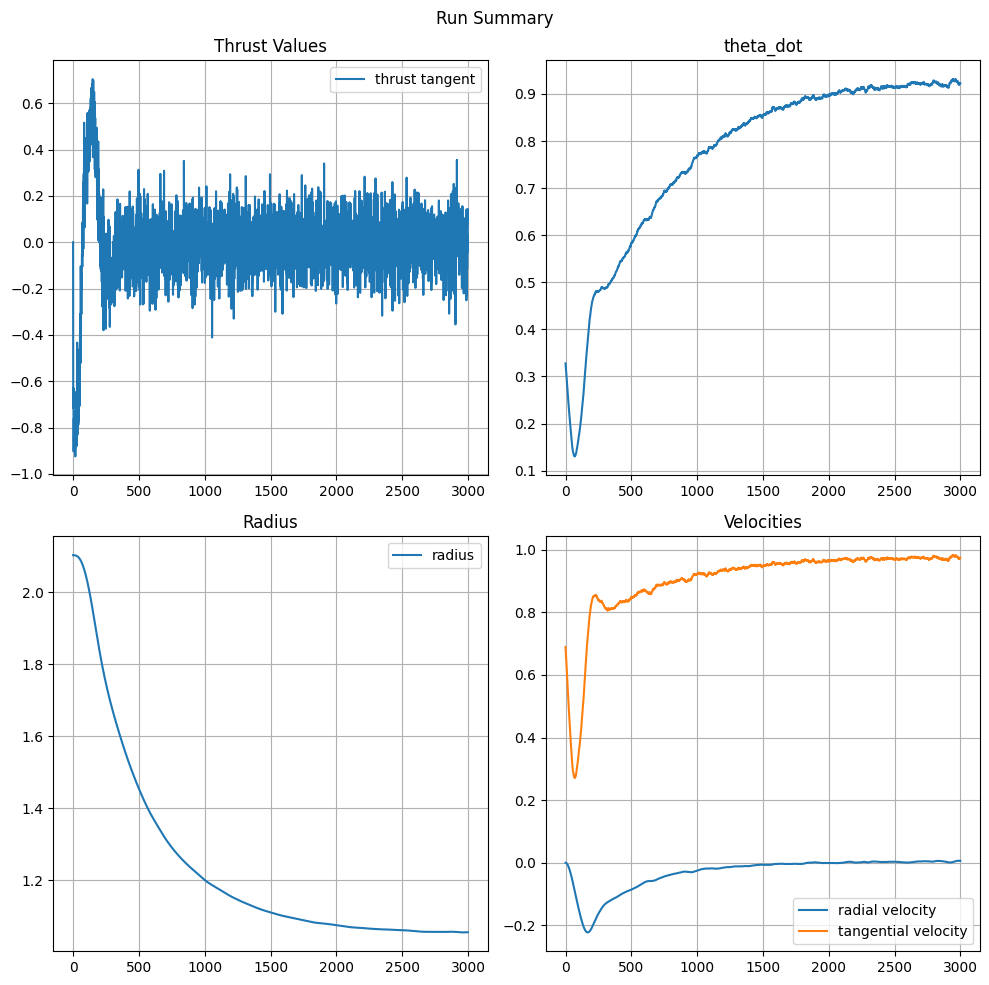

In [ ]:
def get_hohmann_delta_v(GM=1, r_end=1.0, r_init: float = Any, state = Any):
    # are we within 0.005 radius of optimal point?
    by_r_init = np.clip(-np.log(200*np.abs(state[0]-r_init)), 0, 1) > 0
    by_r_end = np.clip(-np.log(200*np.abs(state[0]-1)), 0, 1) > 0
    # output hohmann transfer ideal acceleration at that point then
    if by_r_init:
        return math.sqrt(GM / r_init) * (math.sqrt(2 * r_end / (r_init + r_end)) - 1) # delta v needed at r_init
    elif by_r_end:
        return math.sqrt(GM / r_end) * (1 - math.sqrt(2 * r_init / (r_init + r_end))) # delta v needed at r_end
    else:
        return 0

def orbit1_1() -> Callable[[], List[np.float32]]:
  def func():
    r = np.random.uniform(rmin, rmax, 1)[0]
    theta = np.random.uniform(0, 2 * np.pi)
    rdot = 0
    v_dot = 1 / np.sqrt(r)

    pos = [r, 0]
    vel = [rdot, v_dot]
    rot_mat = np.array([[np.cos(theta), -np.sin(theta)],
                        [np.sin(theta), np.cos(theta)]])
    return [*(rot_mat @ pos), *(rot_mat @ vel)]
  return func

rmin = 0.2
rmax = 4.0
w_t = 5
w_r = 10
w_p = 10
max_ep_len = 25_000
max_training_timesteps = 20_000_000
dt = 0.01
ppo_agent = PPO(4, 1, 1e-3, 2e-3, 0.9998, 80, 0.2, True, 0.1)
ppo_agent.load("/content/gen_hohmann.pth")

init_func = orbit1_1()
env = RocketEnv(max_step=25_000, simulation_step=1, rmax=rmax, rmin=rmin,
            w_r = w_r , w_p = w_p, w_t = w_t,
            mode = "Ln", init_func=init_func,
            max_thrust=1, oob_penalty=0, dt = dt)
env = PolarizeObservation(env)
env = CTangentialThrust(env)
state = env.reset()
r_init = state[0]
needed_delta_v = get_hohmann_delta_v(r_init=r_init, state=state)
state = np.append(state, needed_delta_v)

done = False
i = 0
while not done:
    env.render()
    action = ppo_agent.select_action(state, 1, -1)

    state, reward, done, _ = env.step(action)
    needed_delta_v = get_hohmann_delta_v(r_init=r_init, state=state)
    state = np.append(state, needed_delta_v)
    i += 1
    done = done or i == 3_000

print(i)
env.show(path='gen_hohmann.mp4')
show_video('gen_hohmann.mp4')

/usr/local/lib/python3.10/dist-packages/gym/spaces/box.py:128: UserWarning: WARN: Box bound precision lowered by casting to float32
  logger.warn(f"Box bound precision lowered by casting to {self.dtype}")
/usr/local/lib/python3.10/dist-packages/gym/core.py:317: DeprecationWarning: WARN: Initializing wrapper in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(
<ipython-input-16-85e34c7b1fdf>:4: RuntimeWarning: divide by zero encountered in log
  by_r_init = np.clip(-np.log(200*np.abs(state[0]-r_init)), 0, 1) > 0


3000
It is creating a figure 1 


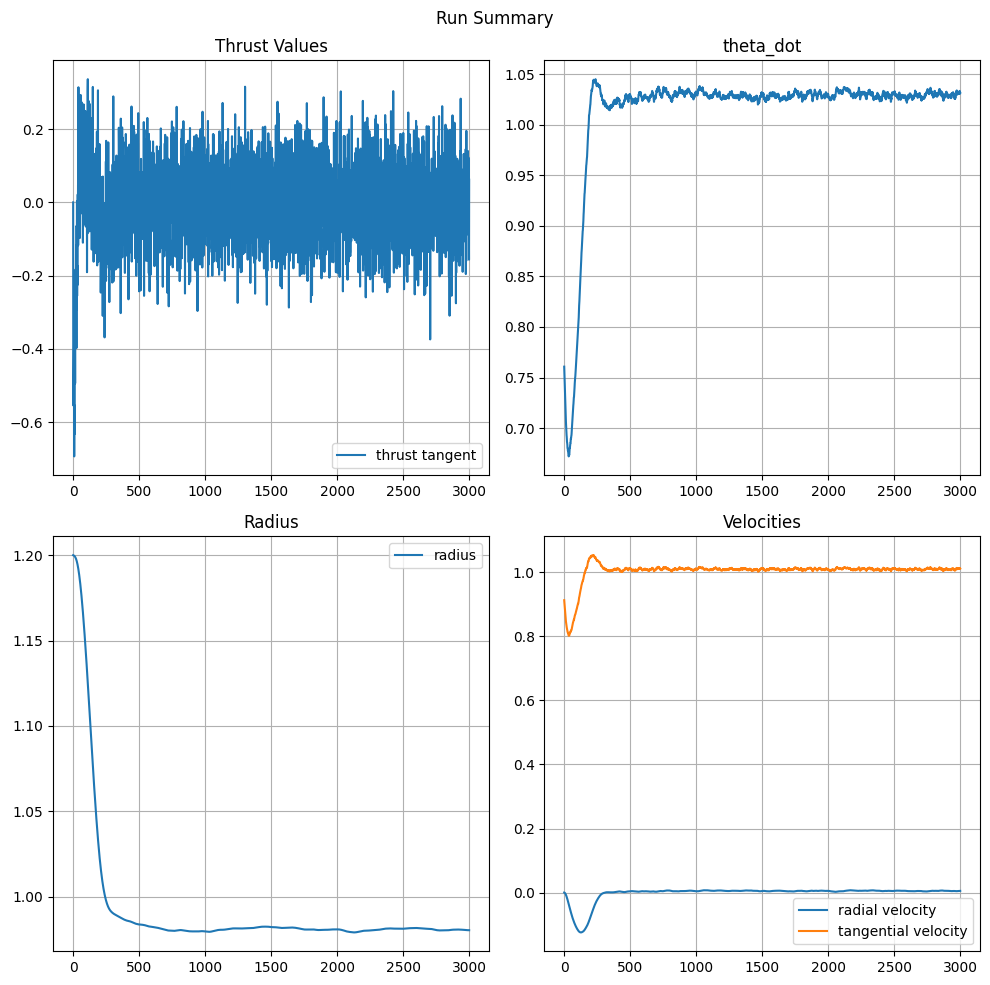

In [ ]:
### Trained on R_0 = 1.2, R_target = 1.0

def get_hohmann_delta_v(GM=1, r_end=1.0, r_init: float = Any, state = Any):
    by_r_init = np.clip(-np.log(200*np.abs(state[0]-r_init)), 0, 1) > 0
    by_r_end = np.clip(-np.log(200*np.abs(state[0]-1)), 0, 1) > 0
    if by_r_init:
        return math.sqrt(GM / r_init) * (math.sqrt(2 * r_end / (r_init + r_end)) - 1) # delta v needed at r_init
    elif by_r_end:
        return math.sqrt(GM / r_end) * (1 - math.sqrt(2 * r_init / (r_init + r_end))) # delta v needed at r_end
    else:
        return 0

def orbit1_1(r) -> Callable[[], List[np.float32]]:
  def func():
    theta = np.random.uniform(0, 2 * np.pi)
    rdot = 0
    v_dot = 1 / np.sqrt(r)

    pos = [r, 0]
    vel = [rdot, v_dot]
    rot_mat = np.array([[np.cos(theta), -np.sin(theta)],
                        [np.sin(theta), np.cos(theta)]])
    return [*(rot_mat @ pos), *(rot_mat @ vel)]
  return func

rmin = 0.7
rmax = 1.3
w_t = 30
w_r = 10
w_p = 10
max_ep_len = 25_000
max_training_timesteps = 20_000_000
dt = 0.01
ppo_agent = PPO(4, 1, 1e-3, 2e-3, 0.9998, 80, 0.2, True, 0.1)
ppo_agent.load("/content/hohmann.pth")

init_func = orbit1_1(1.2)
env = RocketEnv(max_step=25_000, simulation_step=1, rmax=rmax, rmin=rmin,
            w_r = w_r , w_p = w_p, w_t = w_t,
            mode = "Ln", init_func=init_func,
            max_thrust=1, oob_penalty=0, dt = dt)
env = PolarizeObservation(env)
env = CTangentialThrust(env)
state = env.reset()
r_init = state[0]
needed_delta_v = get_hohmann_delta_v(r_init=r_init, state=state)
state = np.append(state, needed_delta_v)

done = False
i = 0
while not done:
    env.render()
    action = ppo_agent.select_action(state, 1, -1)

    state, reward, done, _ = env.step(action)
    needed_delta_v = get_hohmann_delta_v(r_init=r_init, state=state)
    state = np.append(state, needed_delta_v)
    i += 1
    done = done or i == 3_000

print(i)
env.show(path='hohmann.mp4')
show_video('hohmann.mp4')

#### Testing Generalization

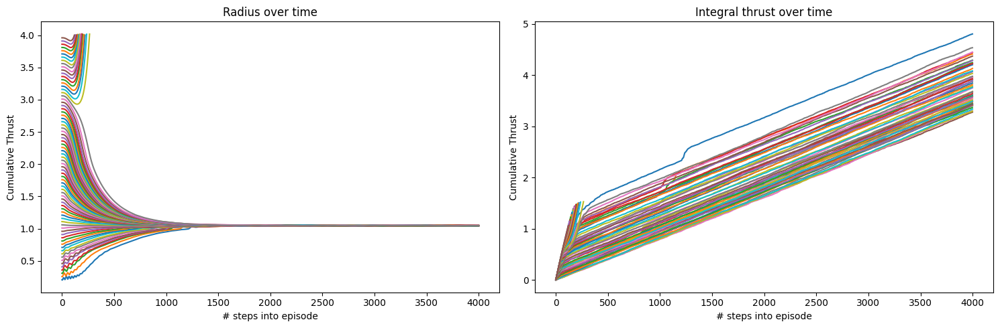

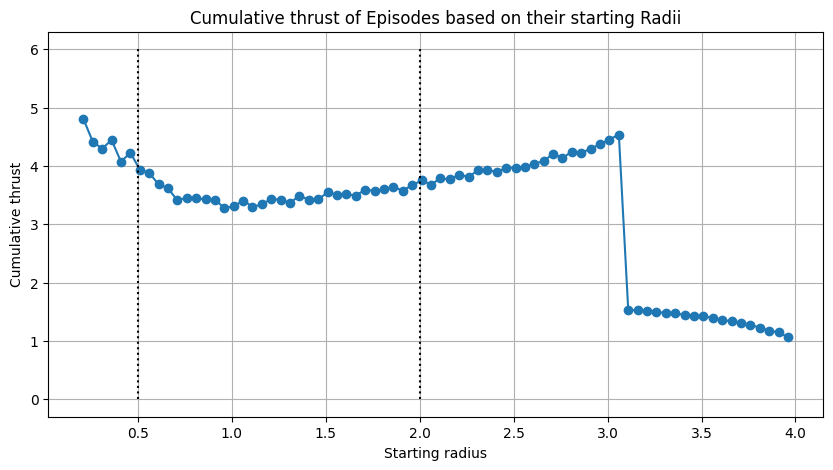

<ipython-input-20-e5f7f0aa975f>:5: RuntimeWarning: divide by zero encountered in log
  by_r_init = np.clip(-np.log(200*np.abs(state[0]-r_init)), 0, 1) > 0


3.11-- [1.5198349] 265Warning: Stepping after done is True
3.16-- [1.5136269] 237Warning: Stepping after done is True
3.31-- [1.4686046] 198Warning: Stepping after done is True
3.36-- [1.4602262] 192Warning: Stepping after done is True
3.46-- [1.4254389] 177Warning: Stepping after done is True
3.51-- [1.4127285] 175Warning: Stepping after done is True
3.61-- [1.3531487] 167Warning: Stepping after done is True
3.71-- [1.3036262] 153Warning: Stepping after done is True
3.76-- [1.2627285] 149Warning: Stepping after done is True
3.91-- [1.1355178] 129Warning: Stepping after done is True
3.96-- [1.0575038] 119

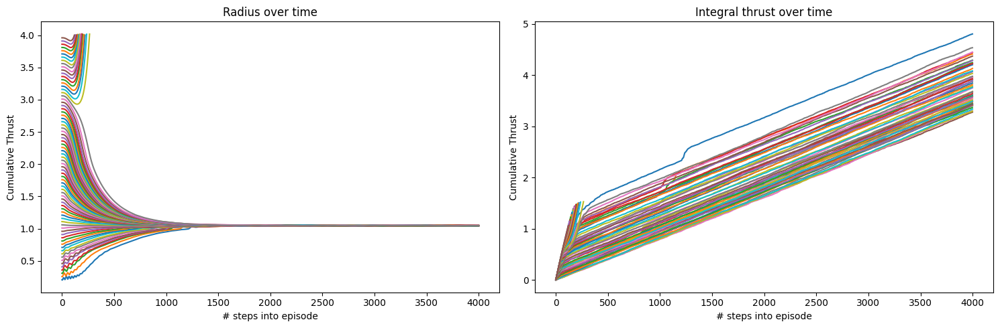

In [ ]:
### Trained on 0.5-2.0
### Tested on 0.2-4.0

def get_hohmann_delta_v(GM=1, r_end=1.0, r_init: float = Any, state = Any):
    # are we within 0.005 radius of optimal point?
    by_r_init = np.clip(-np.log(200*np.abs(state[0]-r_init)), 0, 1) > 0
    by_r_end = np.clip(-np.log(200*np.abs(state[0]-1)), 0, 1) > 0
    # output hohmann transfer ideal acceleration at that point then
    if by_r_init:
        return math.sqrt(GM / r_init) * (math.sqrt(2 * r_end / (r_init + r_end)) - 1) # delta v needed at r_init
    elif by_r_end:
        return math.sqrt(GM / r_end) * (1 - math.sqrt(2 * r_init / (r_init + r_end))) # delta v needed at r_end
    else:
        return 0

def orbit1_1(r) -> Callable[[], List[np.float32]]:
  def func():
    theta = np.random.uniform(0, 2 * np.pi)
    rdot = 0
    v_dot = 1 / np.sqrt(r)

    pos = [r, 0]
    vel = [rdot, v_dot]
    rot_mat = np.array([[np.cos(theta), -np.sin(theta)],
                              [np.sin(theta), np.cos(theta)]])
    return [*(rot_mat @ pos), *(rot_mat @ vel)]
  return func

rmin = 0.2
rmax = 4.0
mode = "Ln"
w_t = 5
w_r = 10
w_p = 10
num = "1"
max_ep_len = 25_000
max_training_timesteps = 20_000_000
dt = 0.01

################# training procedure ################

# initialize a PPO agent
ppo_agent = PPO(4, 1, 1e-3, 2e-3, 0.9999, 80, 0.2, True, 0.1)
ppo_agent.load("/content/gen_hohmann.pth")

rs_list = []
actions_list = []
labels = [round(r, 3) for r in np.arange(0.21, 3.99, 0.05)]
for r in labels:
  init_func = orbit1_1(r)
  env = RocketEnv(max_step=25_000, simulation_step=1, rmax=4.0, rmin=rmin,
              w_r = w_r , w_p = w_p, w_t = w_t,
              mode = "Ln", init_func=init_func,
              max_thrust=1, oob_penalty=0, dt = dt)
  env = PolarizeObservation(env)
  env = CTangentialThrust(env)

  state = env.reset()
  r_init = state[0]
  needed_delta_v = get_hohmann_delta_v(r_init=r_init, state=state)
  state = np.append(state, needed_delta_v)

  done = False
  i = 0
  r_list = []
  old_action = 0
  action_list = []
  while not done:
      print(f"\r{r}-- {old_action} {i}", end="")
      env.render()
      action = ppo_agent.select_action(state, 1, -1)
      state, reward, done, _ = env.step(action)
      needed_delta_v = get_hohmann_delta_v(r_init=r_init, state=state)
      state = np.append(state, needed_delta_v)

      r_list.append(state[0])
      action_list.append(old_action + np.abs(action*dt))
      old_action += np.abs(action*dt)
      i += 1
      done = done or i == 4_000
  rs_list.append(r_list)
  actions_list.append(action_list)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

for i in range(len(rs_list)):
    ax1.plot(np.arange(len(rs_list[i])), rs_list[i])
ax1.set_title('Radius over time')
ax1.set_xlabel("# steps into episode")
ax1.set_ylabel("Cumulative Thrust")

for i in range(len(actions_list)):
    ax2.plot(np.arange(len(actions_list[i])), actions_list[i])
ax2.set_title('Integral thrust over time')
ax2.set_xlabel('# steps into episode')
ax2.set_ylabel('Cumulative Thrust')

plt.tight_layout()
plt.show()

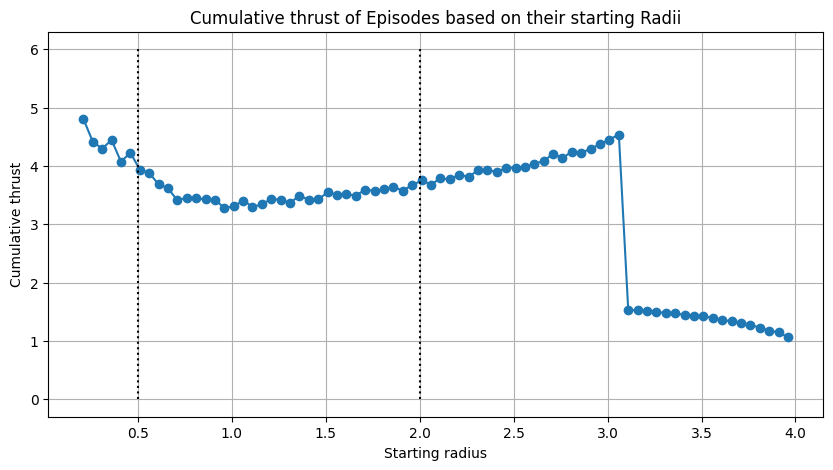

In [ ]:
final_thrusts = [sublist[-1] for sublist in actions_list]
x = np.arange(0.21, 3.99, 0.05)

plt.figure(figsize=(10, 5))
plt.plot(x, final_thrusts, marker='o')
y = np.arange(0, 7)
plt.plot([0.5 for _ in range(len(y))], y, linestyle="dotted", color="black")
plt.plot([2.0 for _ in range(len(y))], y, linestyle="dotted", color="black")

plt.title('Cumulative thrust of Episodes based on their starting Radii')
plt.xlabel('Starting radius')
plt.ylabel('Cumulative thrust')
plt.grid(True)
plt.show()

#### State var experiment #1

<ipython-input-18-432f2dffe29a>:6: RuntimeWarning: divide by zero encountered in log
  by_r_init = np.clip(-np.log(200*np.abs(state[0]-r_init)), 0, 1) > 0


3.91-- [4.7310443] 3999

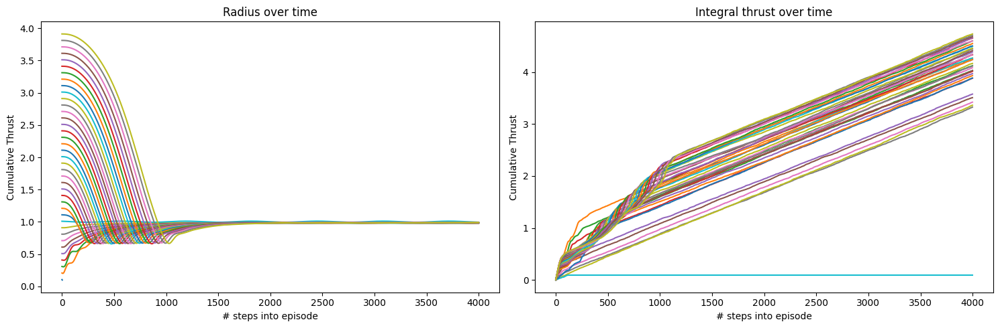

In [ ]:
### Trained & Tested on 0.1-4.0

def get_hohmann_needed_delta_v(GM, r_end, r_init, state, time_at_desired):
    # are we within 0.005 radius of optimal point?
    by_r_init = np.clip(-np.log(200*np.abs(state[0]-r_init)), 0, 1) > 0
    by_r_end = np.clip(-np.log(200*np.abs(state[0]-1)), 0, 1) > 0
    # output hohmann transfer ideal acceleration at that point then

    if by_r_init:
        starter_vel = 1 / np.sqrt(r_init) # tan vel at stable orbit
        desired_vel = starter_vel + math.sqrt(GM / r_init) * (math.sqrt(2 * r_end / (r_init + r_end)) - 1) # delta v needed at r_init from stable orbit
        err_vel = state[2] - desired_vel # sign of desired thrust preserved
        return err_vel, time_at_desired
    elif by_r_end:
        end_vel = 1 / np.sqrt(r_end) # tan vel at stable orbit
        err_vel = state[2] - end_vel # sign of desired thrust preserved

        time_at_desired += 1
        return err_vel, time_at_desired
    else:
        return 0, time_at_desired

def orbit1_1(r) -> Callable[[], List[np.float32]]:
  def func():
    theta = np.random.uniform(0, 2 * np.pi)
    rdot = 0
    v_dot = 1 / np.sqrt(r)

    pos = [r, 0]
    vel = [rdot, v_dot]
    rot_mat = np.array([[np.cos(theta), -np.sin(theta)],
                              [np.sin(theta), np.cos(theta)]])
    return [*(rot_mat @ pos), *(rot_mat @ vel)]
  return func

rmin = 0.1
rmax = 4.0
mode = "Ln"
w_t = 5
w_r = 10
w_p = 10
num = "1"
max_ep_len = 25_000
max_training_timesteps = 20_000_000
dt = 0.01

################# training procedure ################

# initialize a PPO agent
ppo_agent = PPO(5, 1, 1e-3, 2e-3, 0.9999, 80, 0.2, True, 0.1)
ppo_agent.load("/content/gen_hohmann-2.pth")

rs_list = []
actions_list = []
labels = [round(r, 3) for r in np.arange(0.11, 3.99, 0.1)]
for r in labels:
  init_func = orbit1_1(r)
  env = RocketEnv(max_step=25_000, simulation_step=1, rmax=4.0, rmin=rmin,
              w_r = w_r , w_p = w_p, w_t = w_t,
              mode = "Ln", init_func=init_func,
              max_thrust=1, oob_penalty=0, dt = dt)
  env = PolarizeObservation(env)
  env = CTangentialThrust(env)

  state = env.reset()
  r_init = state[0]
  needed_delta_v, time_at_desired = get_hohmann_needed_delta_v(1, 1.0, r_init, state, 0)
  state = np.append(state, needed_delta_v)
  state = np.append(state, state[2]*state[0])

  done = False
  i = 0
  r_list = []
  old_action = 0
  action_list = []
  while not done:
      print(f"\r{r}-- {old_action} {i}", end="")
      env.render()
      action = ppo_agent.select_action(state, 1, -1)
      state, reward, done, _ = env.step(action)

      needed_delta_v, time_at_desired = get_hohmann_needed_delta_v(1, 1.0, r_init, state, time_at_desired)
      state = np.append(state, needed_delta_v)
      state = np.append(state, state[2]*state[0])

      if time_at_desired == 50:
          while i < 4_000 and not done:
              state, _, done, _ = env.step(torch.tensor([0]))
              needed_delta_v, time_at_desired = get_hohmann_needed_delta_v(1, 1.0, r_init, state, 0)
              state = np.append(state, needed_delta_v)
              state = np.append(state, state[2]*state[0])

              r_list.append(state[0])
              action_list.append(old_action)
              i += 1
          done = True

      else:
          r_list.append(state[0])
          action_list.append(old_action + np.abs(action*dt))
          old_action += np.abs(action*dt)
          i += 1
          done = done or i == 4_000

  rs_list.append(r_list)
  actions_list.append(action_list)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

for i in range(len(rs_list)):
    ax1.plot(np.arange(len(rs_list[i])), rs_list[i])
ax1.set_title('Radius over time')
ax1.set_xlabel("# steps into episode")
ax1.set_ylabel("Cumulative Thrust")

for i in range(len(actions_list)):
    ax2.plot(np.arange(len(actions_list[i])), actions_list[i])
ax2.set_title('Integral thrust over time')
ax2.set_xlabel('# steps into episode')
ax2.set_ylabel('Cumulative Thrust')

plt.tight_layout()
plt.show()

#### State var experiment #2

/usr/local/lib/python3.10/dist-packages/gym/spaces/box.py:128: UserWarning: WARN: Box bound precision lowered by casting to float32
  logger.warn(f"Box bound precision lowered by casting to {self.dtype}")
/usr/local/lib/python3.10/dist-packages/gym/core.py:317: DeprecationWarning: WARN: Initializing wrapper in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(
<ipython-input-12-f6d964e2dced>:6: RuntimeWarning: divide by zero encountered in log
  by_r_init = np.clip(-np.log(200*np.abs(state[0]-r_init)), 0, 1) > 0


1.0-- [0.05288739] 70

<ipython-input-12-f6d964e2dced>:7: RuntimeWarning: divide by zero encountered in log
  by_r_end = np.clip(-np.log(200*np.abs(state[0]-1)), 0, 1) > 0


9.9-- [4.2203627] 4999

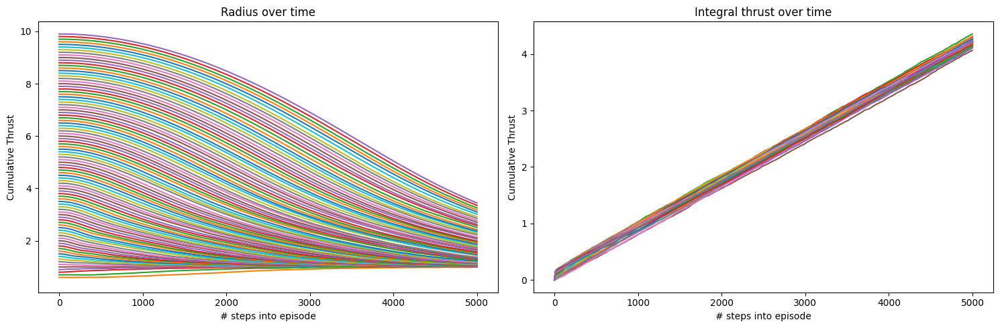

In [ ]:
### Trained on 0.5-2.0
### Tested on 0.2-4.0

def get_hohmann_delta_v(GM, r_end, r_init, state):
    # are we within 0.005 radius of optimal point?
    by_r_init = np.clip(-np.log(200*np.abs(state[0]-r_init)), 0, 1) > 0
    by_r_end = np.clip(-np.log(200*np.abs(state[0]-1)), 0, 1) > 0
    # output hohmann transfer ideal acceleration at that point then
    if by_r_init:
        return math.sqrt(GM / r_init) * (math.sqrt(2 * r_end / (r_init + r_end)) - 1) # delta v needed at r_init
    elif by_r_end:
        return math.sqrt(GM / r_end) * (1 - math.sqrt(2 * r_init / (r_init + r_end))) # delta v needed at r_end
    else:
        return 0

def orbit1_1(r) -> Callable[[], List[np.float32]]:
  def func():
    theta = np.random.uniform(0, 2 * np.pi)
    rdot = 0
    v_dot = 1 / np.sqrt(r)

    pos = [r, 0]
    vel = [rdot, v_dot]
    rot_mat = np.array([[np.cos(theta), -np.sin(theta)],
                              [np.sin(theta), np.cos(theta)]])
    return [*(rot_mat @ pos), *(rot_mat @ vel)]
  return func

rmin = 0.5
rmax = 10.0
mode = "Ln"
w_t = 5
w_r = 10
w_p = 10
num = "1"
max_ep_len = 25_000
max_training_timesteps = 20_000_000
dt = 0.01

################# training procedure ################

# initialize a PPO agent
ppo_agent = PPO(5, 1, 1e-3, 2e-3, 0.9999, 80, 0.2, True, 0.1)
ppo_agent.load("/content/gen_hohmann-2.pth")

rs_list = []
actions_list = []
labels = [round(r, 3) for r in np.arange(rmin, rmax, 0.1)]
for r in labels:
  init_func = orbit1_1(r)
  env = RocketEnv(max_step=25_000, simulation_step=1, rmax=rmax, rmin=rmin,
              w_r = w_r , w_p = w_p, w_t = w_t,
              mode = "Ln", init_func=init_func,
              max_thrust=1, oob_penalty=0, dt = dt)
  env = PolarizeObservation(env)
  env = CTangentialThrust(env)

  state = env.reset()
  r_init = state[0]
  needed_delta_v = get_hohmann_delta_v(1, 1, r_init, state)
  state = np.append(state, needed_delta_v)
  state = np.append(state, state[2]*state[0])
  state[0] = np.sqrt(state[0])

  done = False
  i = 0
  r_list = []
  old_action = 0
  action_list = []
  while not done:
      print(f"\r{r}-- {old_action} {i}", end="")
      env.render()
      action = ppo_agent.select_action(state, 1, -1)
      state, reward, done, _ = env.step(action)
      needed_delta_v = get_hohmann_delta_v(1, 1, r_init, state)
      state = np.append(state, needed_delta_v)
      state = np.append(state, state[2]*state[0])

      r_list.append(state[0])
      state[0] = np.sqrt(state[0])

      action_list.append(old_action + np.abs(action*dt))
      old_action += np.abs(action*dt)
      i += 1
      done = done or i == 5_000
  rs_list.append(r_list)
  actions_list.append(action_list)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

for i in range(len(rs_list)):
    ax1.plot(np.arange(len(rs_list[i])), rs_list[i])
ax1.set_title('Radius over time')
ax1.set_xlabel("# steps into episode")
ax1.set_ylabel("Cumulative Thrust")

for i in range(len(actions_list)):
    ax2.plot(np.arange(len(actions_list[i])), actions_list[i])
ax2.set_title('Integral thrust over time')
ax2.set_xlabel('# steps into episode')
ax2.set_ylabel('Cumulative Thrust')

plt.tight_layout()
plt.show()

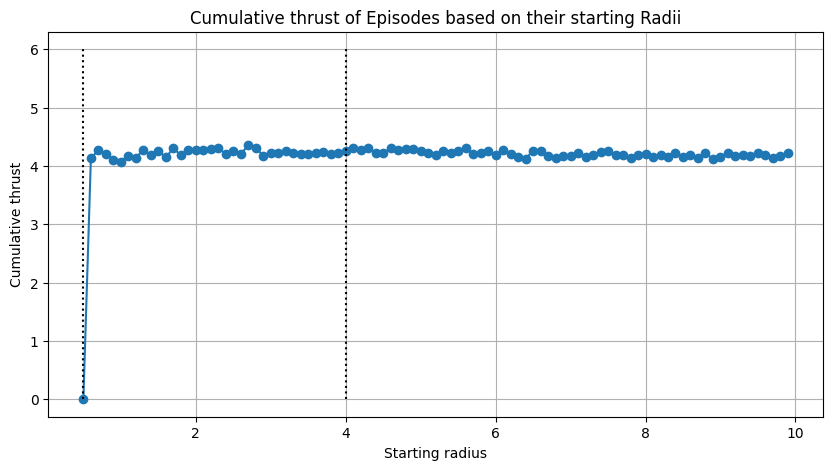

In [ ]:
final_thrusts = [sublist[-1] for sublist in actions_list]
x = np.arange(0.5, 10.0, 0.1)

plt.figure(figsize=(10, 5))
plt.plot(x, final_thrusts, marker='o')
y = np.arange(0, 7)
plt.plot([0.5 for _ in range(len(y))], y, linestyle="dotted", color="black")
plt.plot([4.0 for _ in range(len(y))], y, linestyle="dotted", color="black")

plt.title('Cumulative thrust of Episodes based on their starting Radii')
plt.xlabel('Starting radius')
plt.ylabel('Cumulative thrust')
plt.grid(True)
plt.show()

/usr/local/lib/python3.10/dist-packages/gym/spaces/box.py:128: UserWarning: WARN: Box bound precision lowered by casting to float32
  logger.warn(f"Box bound precision lowered by casting to {self.dtype}")
/usr/local/lib/python3.10/dist-packages/gym/core.py:317: DeprecationWarning: WARN: Initializing wrapper in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(
<ipython-input-12-f6d964e2dced>:6: RuntimeWarning: divide by zero encountered in log
  by_r_init = np.clip(-np.log(200*np.abs(state[0]-r_init)), 0, 1) > 0


3000
It is creating a figure 1 


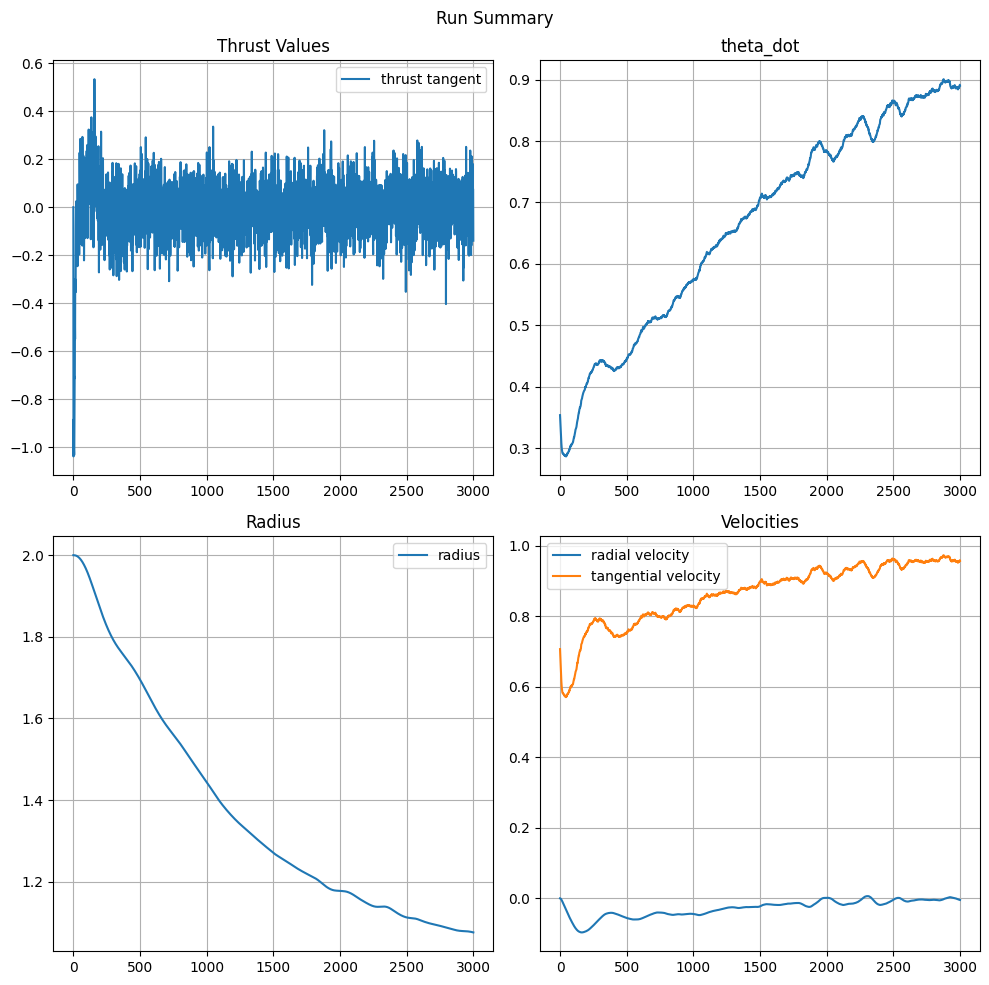

In [ ]:
ppo_agent = PPO(5, 1, 1e-3, 2e-3, 0.9999, 80, 0.2, True, 0.1)
ppo_agent.load("/content/gen_hohmann-2.pth")

init_func = orbit1_1(2)
env = RocketEnv(max_step=25_000, simulation_step=1, rmax=rmax, rmin=rmin,
            w_r = 10 , w_p = 10, w_t = 5,
            mode = "Ln", init_func=init_func,
            max_thrust=1, oob_penalty=0, dt = dt)
env = PolarizeObservation(env)
env = CTangentialThrust(env)

state = env.reset()
r_init = state[0]
needed_delta_v = get_hohmann_delta_v(1, 1, r_init, state)
state = np.append(state, needed_delta_v)
state = np.append(state, state[2]*state[0])
state[0] = np.sqrt(state[0])

done = False
i = 0
while not done:
    env.render()
    action = ppo_agent.select_action(state, 1, -1)

    state, reward, done, _ = env.step(action)
    needed_delta_v = get_hohmann_delta_v(1, 1, r_init, state)
    state = np.append(state, needed_delta_v)
    state = np.append(state, state[2]*state[0])
    state[0] = np.sqrt(state[0])

    i += 1
    done = done or i == 3_000

print(i)
env.show(path='gen_hohmann.mp4')
show_video('gen_hohmann.mp4')

#### State var experiment #3

/usr/local/lib/python3.10/dist-packages/gym/spaces/box.py:128: UserWarning: WARN: Box bound precision lowered by casting to float32
  logger.warn(f"Box bound precision lowered by casting to {self.dtype}")
/usr/local/lib/python3.10/dist-packages/gym/core.py:317: DeprecationWarning: WARN: Initializing wrapper in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(
<ipython-input-7-6d48c2e8a71a>:6: RuntimeWarning: divide by zero encountered in log
  by_r_init = np.clip(-np.log(200*np.abs(state[0]-r_init)), 0, 1) > 0


1.0-- [0.05446257] 68

<ipython-input-7-6d48c2e8a71a>:7: RuntimeWarning: divide by zero encountered in log
  by_r_end = np.clip(-np.log(200*np.abs(state[0]-1)), 0, 1) > 0


6.9-- [8.239357] 9999

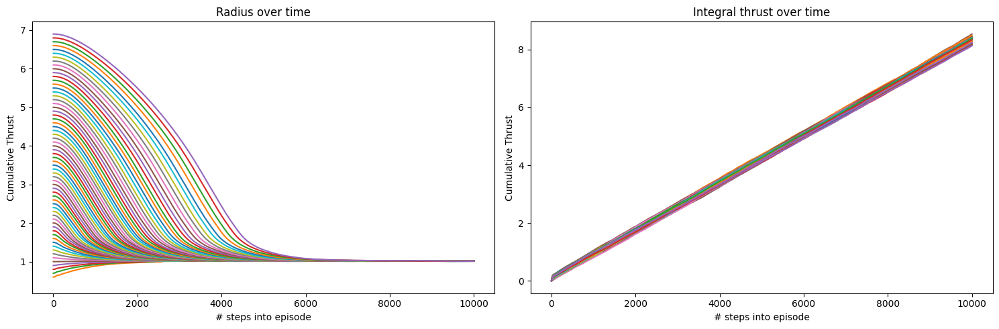

In [ ]:
### Trained on 0.5-2.0
### Tested on 0.2-4.0

def get_hohmann_delta_v(GM, r_end, r_init, state):
    # are we within 0.005 radius of optimal point?
    by_r_init = np.clip(-np.log(200*np.abs(state[0]-r_init)), 0, 1) > 0
    by_r_end = np.clip(-np.log(200*np.abs(state[0]-1)), 0, 1) > 0
    # output hohmann transfer ideal acceleration at that point then
    if by_r_init:
        return math.sqrt(GM / r_init) * (math.sqrt(2 * r_end / (r_init + r_end)) - 1) # delta v needed at r_init
    elif by_r_end:
        return math.sqrt(GM / r_end) * (1 - math.sqrt(2 * r_init / (r_init + r_end))) # delta v needed at r_end
    else:
        return 0

def orbit1_1(r) -> Callable[[], List[np.float32]]:
  def func():
    theta = np.random.uniform(0, 2 * np.pi)
    rdot = 0
    v_dot = 1 / np.sqrt(r)

    pos = [r, 0]
    vel = [rdot, v_dot]
    rot_mat = np.array([[np.cos(theta), -np.sin(theta)],
                              [np.sin(theta), np.cos(theta)]])
    return [*(rot_mat @ pos), *(rot_mat @ vel)]
  return func

rmin = 0.5
rmax = 7.0
mode = "Ln"
w_t = 5
w_r = 10
w_p = 10
num = "1"
max_ep_len = 25_000
max_training_timesteps = 20_000_000
dt = 0.01

################# training procedure ################

# initialize a PPO agent
ppo_agent = PPO(6, 1, 1e-3, 2e-3, 0.9999, 80, 0.2, True, 0.1)
ppo_agent.load("/content/gen_hohmann-3.pth")

rs_list = []
actions_list = []
labels = [round(r, 3) for r in np.arange(rmin, rmax, 0.1)]
for r in labels:
  init_func = orbit1_1(r)
  env = RocketEnv(max_step=25_000, simulation_step=1, rmax=rmax, rmin=rmin,
              w_r = w_r , w_p = w_p, w_t = w_t,
              mode = "Ln", init_func=init_func,
              max_thrust=1, oob_penalty=0, dt = dt)
  env = PolarizeObservation(env)
  env = CTangentialThrust(env)

  state = env.reset()
  r_init = state[0]
  needed_delta_v = get_hohmann_delta_v(1, 1, r_init, state)
  state = np.append(state, needed_delta_v)
  state = np.append(state, state[2]*state[0])
  state[0] = np.sqrt(state[0])
  state = np.append(state, 1/state[0])

  done = False
  i = 0
  r_list = []
  old_action = 0
  action_list = []
  while not done:
      print(f"\r{r}-- {old_action} {i}", end="")
      env.render()
      action = ppo_agent.select_action(state, 1, -1)
      state, reward, done, _ = env.step(action)
      needed_delta_v = get_hohmann_delta_v(1, 1, r_init, state)
      state = np.append(state, needed_delta_v)
      state = np.append(state, state[2]*state[0])
      state[0] = np.sqrt(state[0])
      state = np.append(state, 1/state[0])
      r_list.append(state[0]**2)

      action_list.append(old_action + np.abs(action*dt))
      old_action += np.abs(action*dt)
      i += 1
      done = done or i == 10_000
  rs_list.append(r_list)
  actions_list.append(action_list)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

for i in range(len(rs_list)):
    ax1.plot(np.arange(len(rs_list[i])), rs_list[i])
ax1.set_title('Radius over time')
ax1.set_xlabel("# steps into episode")
ax1.set_ylabel("Cumulative Thrust")

for i in range(len(actions_list)):
    ax2.plot(np.arange(len(actions_list[i])), actions_list[i])
ax2.set_title('Integral thrust over time')
ax2.set_xlabel('# steps into episode')
ax2.set_ylabel('Cumulative Thrust')

plt.tight_layout()
plt.show()

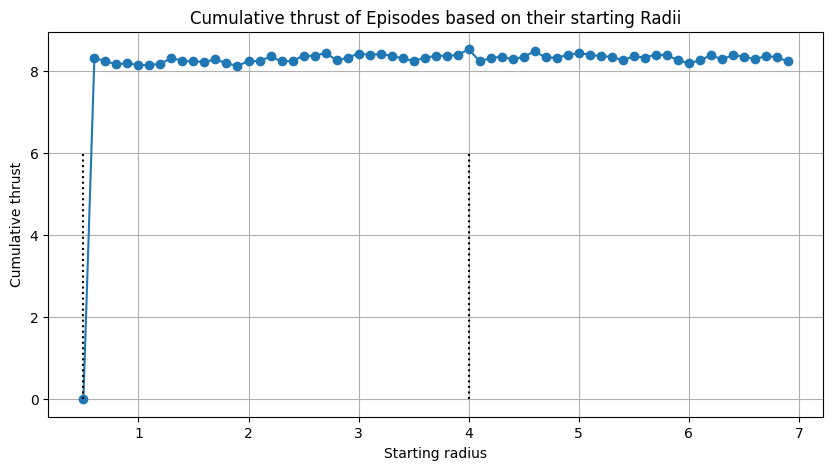

In [ ]:
final_thrusts = [sublist[-1] for sublist in actions_list]
x = np.arange(0.5, 7.0, 0.1)

plt.figure(figsize=(10, 5))
plt.plot(x, final_thrusts, marker='o')
y = np.arange(0, 7)
plt.plot([0.5 for _ in range(len(y))], y, linestyle="dotted", color="black")
plt.plot([4.0 for _ in range(len(y))], y, linestyle="dotted", color="black")

plt.title('Cumulative thrust of Episodes based on their starting Radii')
plt.xlabel('Starting radius')
plt.ylabel('Cumulative thrust')
plt.grid(True)
plt.show()

/usr/local/lib/python3.10/dist-packages/gym/spaces/box.py:128: UserWarning: WARN: Box bound precision lowered by casting to float32
  logger.warn(f"Box bound precision lowered by casting to {self.dtype}")
/usr/local/lib/python3.10/dist-packages/gym/core.py:317: DeprecationWarning: WARN: Initializing wrapper in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(
<ipython-input-12-f6d964e2dced>:6: RuntimeWarning: divide by zero encountered in log
  by_r_init = np.clip(-np.log(200*np.abs(state[0]-r_init)), 0, 1) > 0


3000
It is creating a figure 1 


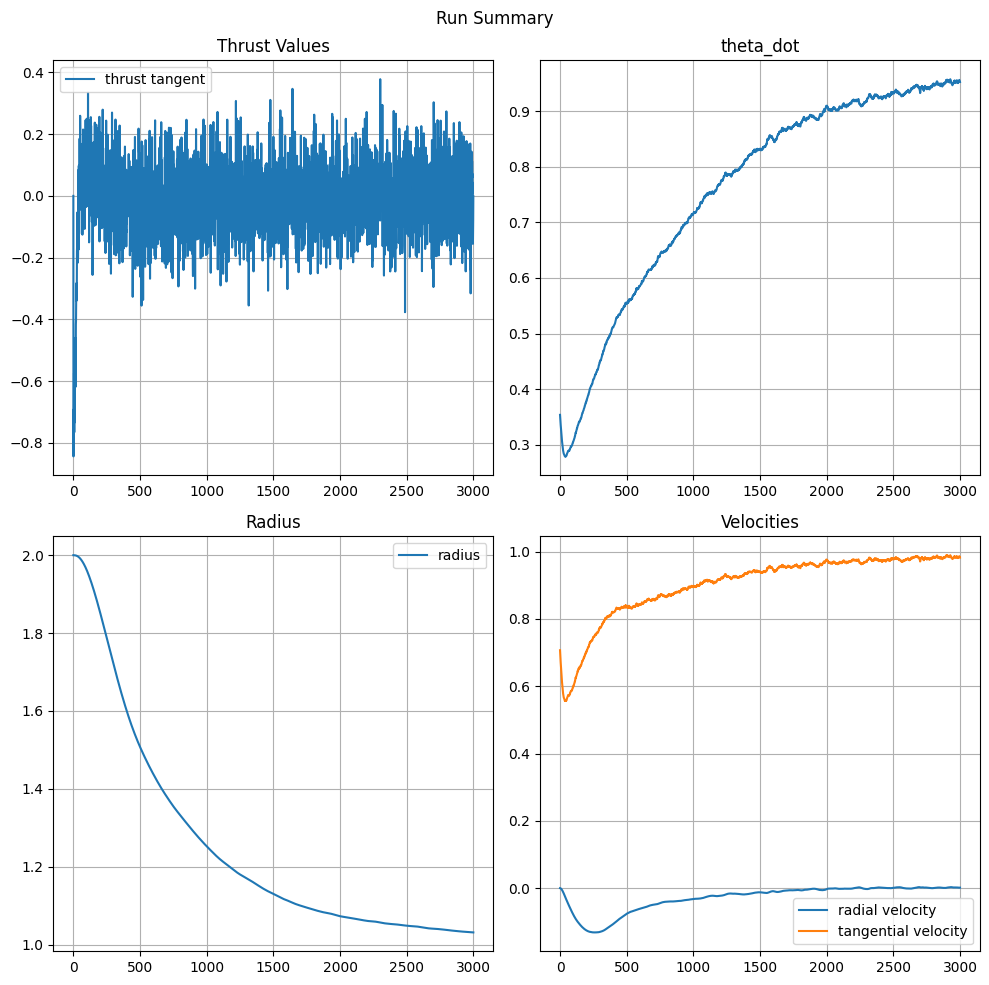

In [ ]:
ppo_agent = PPO(6, 1, 1e-3, 2e-3, 0.9999, 80, 0.2, True, 0.1)
ppo_agent.load("/content/gen_hohmann-3.pth")

init_func = orbit1_1(2)
env = RocketEnv(max_step=25_000, simulation_step=1, rmax=rmax, rmin=rmin,
            w_r = 10 , w_p = 10, w_t = 5,
            mode = "Ln", init_func=init_func,
            max_thrust=1, oob_penalty=0, dt = dt)
env = PolarizeObservation(env)
env = CTangentialThrust(env)

state = env.reset()
r_init = state[0]

state = env.reset()
r_init = state[0]
needed_delta_v = get_hohmann_delta_v(1, 1, r_init, state)
state = np.append(state, needed_delta_v)
state = np.append(state, state[2]*state[0])
state[0] = np.sqrt(state[0])
state = np.append(state, 1/state[0])

done = False
i = 0
while not done:
    env.render()
    action = ppo_agent.select_action(state, 1, -1)

    state, reward, done, _ = env.step(action)
    needed_delta_v = get_hohmann_delta_v(1, 1, r_init, state)
    state = np.append(state, needed_delta_v)
    state = np.append(state, state[2]*state[0])
    state[0] = np.sqrt(state[0])
    state = np.append(state, 1/state[0])

    i += 1
    done = done or i == 3_000

print(i)
env.show(path='gen_hohmann.mp4')
show_video('gen_hohmann.mp4')

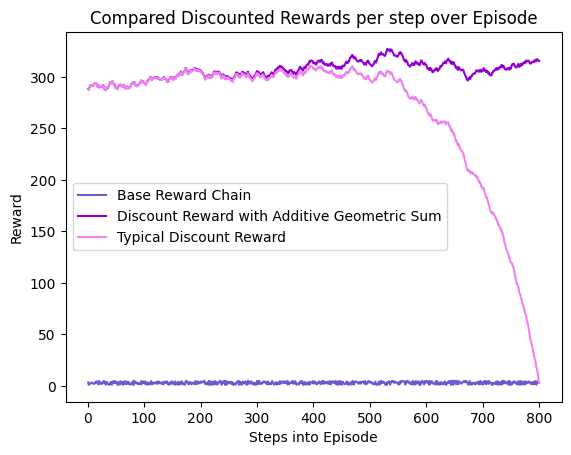

In [7]:
# @title testing discounted rewards
# @markdown Tested on dummy_data that can be computationally verfied smaller than the size of a good episode

import numpy as np
import matplotlib.pyplot as plt


array = [0.3,0.2,0.5,1,1.3,1.5,1.4,1.2,1.5,2,1.3,1.6,1.4,2,1,2.3,2,2.5,3,4,5,6,3,5,3,4,4,4,4,5,5]

def discounted_test(array, good_episode ):
  gamma = 0.99
  good_episode_reward = 0
  rewards_reversed = list(reversed(array))
  discounted_array = []
  discounted_reward = 0
  len_array = len(rewards_reversed)
  if good_episode :
    discounted_reward = rewards_reversed[0] * (gamma**len_array - 1)/(gamma -1)
    good_episode_reward = rewards_reversed[0]

  for reward in rewards_reversed: #This is basically doing with a for loop what my discount function was doing
      if good_episode :
        discounted_reward = reward + (gamma* discounted_reward) - good_episode_reward*gamma**800
              #print("the episode is considered good and the current reward is ", discounted_reward )
      else :
        discounted_reward = reward + (gamma * discounted_reward)
              #print("the episode ended because it reached a bound and the current reward is ", discounted_reward )

      discounted_array.insert(0, discounted_reward)

  return discounted_array

array = np.random.uniform(low=1,high=5,size=800)
discounted_array_with = discounted_test(array, True)
discounted_array_without = discounted_test(array, False)

len_array = len(array)

fig = plt.figure()
num_steps = list(range(1,len_array +1 ))
plt.plot(num_steps,array,color='slateblue',label='Base Reward Chain')
plt.plot(num_steps,discounted_array_with, color='darkviolet', label='Discount Reward with Additive Geometric Sum')
plt.plot(num_steps,discounted_array_without,color='violet', label='Typical Discount Reward')

plt.xlabel('Steps into Episode')
plt.ylabel('Reward')
plt.title('Compared Discounted Rewards per step over Episode')
plt.legend()
plt.show()

